In [3]:
%load_ext autoreload
%autoreload 2
import higashi
# import fasthigashi
import pandas as pd
import numpy as np
import pickle
from tqdm.auto import *
import scanpy as sc
import os
import os

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
data_dir = '/ewsc/zhangruo/GAGE_seq_AD/'
sample_ids = [
'10291856',
'12365619',
'21272396',
'37030589',
'50403446',
'57978756',
'66754397',
'77239958',
'78452313',
'85171938',
'10383017',
'20780035',
'23690880',
'37178462',
'50410319',
'65652206',
'76733461',
'78353027',
'84417209',
'86934089'
]

chroms = [
    'chr1',
    'chr2',
    'chr3',
    'chr4',
    'chr5',
    'chr6',
    'chr7',
    'chr8',
    'chr9',
    'chr10',
    'chr11',
    'chr12',
    'chr13',
    'chr14',
    'chr15',
    'chr16',
    'chr17',
    'chr18',
    'chr19',
    'chr20',
    'chr21',
    'chr22']

## prepare input

In [6]:
meta = pd.read_csv(os.path.join(data_dir, 'AD_rna_annotated.meta.tsv'), sep='\t')
meta

,cell_id,nCount_RNA,nFeature_RNA,major,sub,projid,gender,disease_group,umap_1,umap_2
0,"hPFC-lib-1_A1,A7",4495,1258,Micro,Micro,21272396,Female,CT,13.477755,2.356474
1,"hPFC-lib-1_A1,C5",3582,1116,OPC,OPC,66754397,Male,AD,7.471051,-9.565190
2,"hPFC-lib-1_A1,C8",6806,1685,Oligo,Oligo,66754397,Male,AD,0.194698,4.558290
3,"hPFC-lib-1_A1,C12",11859,2334,Inh,Inh Sst,66754397,Male,AD,4.691800,-1.740023
4,"hPFC-lib-1_A1,D2",10160,1993,Oligo,Oligo,66754397,Male,AD,1.101980,4.757245
...,...,...,...,...,...,...,...,...,...,...
23820,"hPFC-lib-45_H12,A12",31825,3539,Exc,Exc L4 IT,78353027,Male,AD,-7.409585,-3.200846
23821,"hPFC-lib-45_H12,B9",2758,716,Micro,Micro,78353027,Male,AD,11.481553,1.798535
23822,"hPFC-lib-45_H12,E11",26335,3021,Exc,Exc L4 IT,78452313,Male,AD,-6.609201,-5.432102
23823,"hPFC-lib-45_H12,F11",57848,4828,Exc,Exc L4 IT,78452313,Male,AD,-7.522972,-3.796816


In [7]:

# Initialize a list to store the results
rows = []

# Traverse through each sample_id directory to find contact pair files
for sample_id in sample_ids:
    sample_dir = os.path.join(data_dir, 'filtered_pair', sample_id)
    if os.path.exists(sample_dir):  # Check if the directory exists
        for file in os.listdir(sample_dir):
            if "pair.gz" in file:  # Check for files containing 'pair.gz'
                cell_id = file.split('.')[0]  # Extract cell_id from the filename
                rows.append({'cell_id': cell_id, 'sample_id': sample_id})

# Convert to a DataFrame
df = pd.DataFrame(rows)

# Print the DataFrame
print(df)

                   cell_id sample_id
0        hPFC-lib-25_G1,D6  10291856
1       hPFC-lib-41_D4,D11  10291856
2        hPFC-lib-24_H1,D8  10291856
3       hPFC-lib-24_B10,D6  10291856
4      hPFC-lib-41_G11,D10  10291856
...                    ...       ...
50329    hPFC-lib-20_C2,C6  86934089
50330    hPFC-lib-19_C7,D2  86934089
50331   hPFC-lib-10_E10,D8  86934089
50332    hPFC-lib-38_F4,D3  86934089
50333    hPFC-lib-18_C7,C4  86934089

[50334 rows x 2 columns]


In [7]:
meta.index = meta['cell_id']
df.index = df['cell_id']

In [8]:
meta['sample_id'] = df['sample_id']

In [9]:
meta

,cell_id,nCount_RNA,nFeature_RNA,major,sub,projid,gender,disease_group,umap_1,umap_2,sample_id
cell_id,,,,,,,,,,,
"hPFC-lib-1_A1,A7","hPFC-lib-1_A1,A7",4495,1258,Micro,Micro,21272396,Female,CT,13.477755,2.356474,21272396
"hPFC-lib-1_A1,C5","hPFC-lib-1_A1,C5",3582,1116,OPC,OPC,66754397,Male,AD,7.471051,-9.565190,66754397
"hPFC-lib-1_A1,C8","hPFC-lib-1_A1,C8",6806,1685,Oligo,Oligo,66754397,Male,AD,0.194698,4.558290,66754397
"hPFC-lib-1_A1,C12","hPFC-lib-1_A1,C12",11859,2334,Inh,Inh Sst,66754397,Male,AD,4.691800,-1.740023,66754397
"hPFC-lib-1_A1,D2","hPFC-lib-1_A1,D2",10160,1993,Oligo,Oligo,66754397,Male,AD,1.101980,4.757245,66754397
...,...,...,...,...,...,...,...,...,...,...,...
"hPFC-lib-45_H12,A12","hPFC-lib-45_H12,A12",31825,3539,Exc,Exc L4 IT,78353027,Male,AD,-7.409585,-3.200846,78353027
"hPFC-lib-45_H12,B9","hPFC-lib-45_H12,B9",2758,716,Micro,Micro,78353027,Male,AD,11.481553,1.798535,78353027
"hPFC-lib-45_H12,E11","hPFC-lib-45_H12,E11",26335,3021,Exc,Exc L4 IT,78452313,Male,AD,-6.609201,-5.432102,78452313


In [10]:
kept_cells = meta

In [11]:
def logistic_one_cell(info):
    sample, cell = info
    # print (sample, cell)
    pairs = pd.read_csv(os.path.join(data_dir, 
                                     'filtered_pair', 
                                     str(sample), 
                                     f'{cell}.pair.gz'), sep='\t', header=None)
    read_count = len(pairs)
    pairs = pairs.groupby(0)
    stats = [read_count]
    for chrom in chroms:
        try:
            tp = pairs.get_group(chrom)
        except:
            stats.append(0)
            continue
        tp = tp[tp[0] == tp[2]]
        tp['bin1'] = tp[1] // 1000000
        tp['bin2'] = tp[3] // 1000000
        stats.append(np.sum(tp['bin2'] != tp['bin1']))
    return stats

from tqdm.contrib.concurrent import *

stats_all = process_map(logistic_one_cell, zip(np.array(kept_cells['sample_id']), 
                                               np.array(kept_cells['cell_id'])), max_workers=32,
                       total = len(kept_cells))
stats_all = np.array(stats_all)
kept_cells['read_count'] = stats_all[:, 0]
stats_all = stats_all[:, 1:]

  0%|          | 0/23825 [00:00<?, ?it/s]

In [12]:
chrom_length = pd.read_csv("./hg38.chrom.sizes.txt", sep='\t', header=None)
chrom_length.index = chrom_length[0]
lengths = np.array(chrom_length.loc[chroms][1])
lengths = lengths // 1000000
lengths

array([248, 242, 198, 190, 181, 170, 159, 145, 138, 133, 135, 133, 114,
       107, 101,  90,  83,  80,  58,  64,  46,  50])

In [13]:
stats_all = np.array(stats_all)
stats_all
total_reads_all = np.sum(stats_all, axis=-1)

In [14]:
kept_cells['total'] = total_reads_all
kept_cells

,cell_id,nCount_RNA,nFeature_RNA,major,sub,projid,gender,disease_group,umap_1,umap_2,sample_id,read_count,total
cell_id,,,,,,,,,,,,,
"hPFC-lib-1_A1,A7","hPFC-lib-1_A1,A7",4495,1258,Micro,Micro,21272396,Female,CT,13.477755,2.356474,21272396,64012,23734
"hPFC-lib-1_A1,C5","hPFC-lib-1_A1,C5",3582,1116,OPC,OPC,66754397,Male,AD,7.471051,-9.565190,66754397,303281,114200
"hPFC-lib-1_A1,C8","hPFC-lib-1_A1,C8",6806,1685,Oligo,Oligo,66754397,Male,AD,0.194698,4.558290,66754397,429266,144701
"hPFC-lib-1_A1,C12","hPFC-lib-1_A1,C12",11859,2334,Inh,Inh Sst,66754397,Male,AD,4.691800,-1.740023,66754397,149474,55388
"hPFC-lib-1_A1,D2","hPFC-lib-1_A1,D2",10160,1993,Oligo,Oligo,66754397,Male,AD,1.101980,4.757245,66754397,78132,32199
...,...,...,...,...,...,...,...,...,...,...,...,...,...
"hPFC-lib-45_H12,A12","hPFC-lib-45_H12,A12",31825,3539,Exc,Exc L4 IT,78353027,Male,AD,-7.409585,-3.200846,78353027,527732,181859
"hPFC-lib-45_H12,B9","hPFC-lib-45_H12,B9",2758,716,Micro,Micro,78353027,Male,AD,11.481553,1.798535,78353027,676267,310157
"hPFC-lib-45_H12,E11","hPFC-lib-45_H12,E11",26335,3021,Exc,Exc L4 IT,78452313,Male,AD,-6.609201,-5.432102,78452313,338818,128415


In [15]:
kept_cells = kept_cells[np.sum(stats_all > lengths[None] * 1.0, axis=-1) == 22]

In [16]:
kept_cells

,cell_id,nCount_RNA,nFeature_RNA,major,sub,projid,gender,disease_group,umap_1,umap_2,sample_id,read_count,total
cell_id,,,,,,,,,,,,,
"hPFC-lib-1_A1,A7","hPFC-lib-1_A1,A7",4495,1258,Micro,Micro,21272396,Female,CT,13.477755,2.356474,21272396,64012,23734
"hPFC-lib-1_A1,C5","hPFC-lib-1_A1,C5",3582,1116,OPC,OPC,66754397,Male,AD,7.471051,-9.565190,66754397,303281,114200
"hPFC-lib-1_A1,C8","hPFC-lib-1_A1,C8",6806,1685,Oligo,Oligo,66754397,Male,AD,0.194698,4.558290,66754397,429266,144701
"hPFC-lib-1_A1,C12","hPFC-lib-1_A1,C12",11859,2334,Inh,Inh Sst,66754397,Male,AD,4.691800,-1.740023,66754397,149474,55388
"hPFC-lib-1_A1,D2","hPFC-lib-1_A1,D2",10160,1993,Oligo,Oligo,66754397,Male,AD,1.101980,4.757245,66754397,78132,32199
...,...,...,...,...,...,...,...,...,...,...,...,...,...
"hPFC-lib-45_H12,A12","hPFC-lib-45_H12,A12",31825,3539,Exc,Exc L4 IT,78353027,Male,AD,-7.409585,-3.200846,78353027,527732,181859
"hPFC-lib-45_H12,B9","hPFC-lib-45_H12,B9",2758,716,Micro,Micro,78353027,Male,AD,11.481553,1.798535,78353027,676267,310157
"hPFC-lib-45_H12,E11","hPFC-lib-45_H12,E11",26335,3021,Exc,Exc L4 IT,78452313,Male,AD,-6.609201,-5.432102,78452313,338818,128415


In [17]:
label_info = {}
for col in kept_cells:
    label_info[col] = np.array(kept_cells[col])
label_info['cell_name_higashi'] = list(kept_cells.index)

In [18]:
pickle.dump(label_info, open(f"{data_dir}/label_info.pickle", "wb"))

In [19]:
with open(os.path.join(data_dir,  'filelist.txt'), 'w') as f:
    for i, row in kept_cells.iterrows():
        sample = str(row['sample_id'])
        cell = str(row['cell_id'])
        f.write(f'{data_dir}/filtered_pair/{sample}/{cell}.pair.gz\n')

In [20]:
rna_pcs = pd.read_csv(f'{data_dir}/AD_rna_PCA.tsv', sep='\t')
rna_pcs

,PC_1,PC_2,PC_3,PC_4,PC_5,PC_6,PC_7,PC_8,PC_9,PC_10,...,PC_41,PC_42,PC_43,PC_44,PC_45,PC_46,PC_47,PC_48,PC_49,PC_50
"hPFC-lib-1_A1,A7",-12.797497,21.802468,-8.649428,-13.053099,-1.908512,-4.559227,-0.382792,-0.093093,0.373303,-0.992181,...,1.121265,0.512310,-1.192414,-0.169228,-1.017151,-1.545022,1.273023,-0.046826,0.280354,0.979948
"hPFC-lib-1_A1,C5",-3.634392,0.330334,5.379678,0.590821,-3.120164,1.809079,9.484127,-0.176752,0.428102,0.290696,...,0.453289,-0.467759,-1.670674,-0.837061,1.389145,-0.103086,-0.990220,-0.923444,-2.216092,0.736831
"hPFC-lib-1_A1,C8",-3.464313,3.737335,2.218404,5.992520,0.796100,-0.111323,0.171308,-0.742251,-0.003568,0.626356,...,1.159033,-0.657313,1.322594,-0.225798,0.241238,-0.056737,0.466319,-0.910064,-0.425509,-0.120572
"hPFC-lib-1_A1,C12",1.205734,-1.666489,8.694931,-3.781727,-0.564076,-1.291606,-0.998956,1.475359,-1.401118,-3.874711,...,0.096514,0.622100,-0.889041,-0.157495,0.085364,-2.224718,-2.417630,-2.162058,-0.648075,-0.643727
"hPFC-lib-1_A1,D2",-3.432756,3.191738,2.425752,7.319379,-0.220909,-0.431488,0.686802,-1.019116,0.663678,-0.200929,...,-1.072681,-0.004636,-0.584318,0.885781,0.352550,-0.407479,-0.220955,-0.573697,-0.041760,0.228011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"hPFC-lib-45_H12,A12",6.484951,0.823044,-3.071938,0.795921,9.009767,-1.484525,2.155336,0.987029,2.884219,-0.158443,...,-1.628364,-0.626969,0.163099,0.030193,0.369933,0.346412,-0.831024,1.029209,0.216958,1.531454
"hPFC-lib-45_H12,B9",-8.799186,10.948521,-2.757845,-3.770618,-1.560763,-1.303058,-0.055846,-0.641147,0.616686,0.439378,...,-1.455051,0.547411,-0.694840,-1.359759,2.186695,-1.159184,-1.032668,2.808455,-0.638013,-1.881525
"hPFC-lib-45_H12,E11",7.678594,-0.410680,-2.899217,-0.465099,9.233814,-1.862066,1.091867,0.085124,4.641233,-2.054294,...,0.358131,0.034645,0.316302,-0.328466,-0.330476,-0.126099,0.935314,0.857534,2.231517,0.401173
"hPFC-lib-45_H12,F11",8.020374,-0.199692,-3.811337,0.155428,9.904705,-2.112673,2.203703,0.254540,4.521978,-0.728428,...,-0.575213,-1.115854,-0.409686,-1.287799,-0.246603,-0.544695,-0.240568,0.988850,1.555089,-0.594013


In [22]:
embeddings = rna_pcs.loc[kept_cells.index].copy().values
embeddings = np.array(embeddings)
np.save(f'{data_dir}/rna_cell_embedding.npy', embeddings)

## Make config - Joint - FH

In [55]:

os.makedirs(f'{data_dir}/config_dir', exist_ok=True)
config = f'{data_dir}/config_dir/config_gage_ad_50Kb.JSON'
config_info = {
    "data_dir": f"{data_dir}",
    "structured": True,
    "header_included": False,
    "contact_header": ["chrom1", "pos1", "chrom2", "pos2"],
    "input_format": 'higashi_v2',
    "temp_dir": f"{data_dir}/temp_50k",
    "genome_reference_path": "/data/rzhang/Higashi/hg38.chrom.sizes.txt",
    "cytoband_path": "/data/rzhang/Higashi/cytoBand_hg38.txt",
    "chrom_list": ["chr1", "chr2","chr3","chr4","chr5",
                   "chr6","chr7","chr8","chr9","chr10",
                   "chr11","chr12","chr13","chr14","chr15",
                   "chr16","chr17","chr18","chr19","chr20",
                   "chr21","chr22"],
    "resolution": 50000,
    "resolution_cell": 250000,
    "resolution_fh": [100000, 250000, 500000],
    "embedding_name": "test",
    "minimum_distance": 50000,
    "maximum_distance": -1,
    "local_transfer_range": 0,
    "loss_mode": "zinb",
    "dimensions": 256,
    "impute_list":["chr1", "chr2","chr3","chr4","chr5",
                   "chr6","chr7","chr8","chr9","chr10",
                   "chr11","chr12","chr13","chr14","chr15",
                   "chr16","chr17","chr18","chr19","chr20",
                   "chr21","chr22"],
    "neighbor_num": 5,
    "cpu_num": 32,
    "gpu_num": 8,
    "embedding_epoch":60,
    "correct_be_impute": False,
    "persample_id":"sample_id",
    "within_sample_nbr": True,
}
import json
with open(config,"w") as f:
    json.dump(config_info, f, indent = 6)

In [56]:
from higashi.Higashi_wrapper import *
from fasthigashi.FastHigashi_Wrapper import *

config = f'{data_dir}/config_dir/config_gage_ad_50Kb.JSON'
# higashi_model = Higashi(config)
# higashi_model.process_data()
# Try all conv + rwr combination
embedding_all = {}
for conv in [True]:
    for rwr in [True]:
        # Initialize the model
        fh_model = FastHigashi(config_path=config,
                            path2input_cache=f"{data_dir}/temp_50k",
                            path2result_dir=f"{data_dir}/temp_50k",
                            off_diag=200, # 0-100th diag of the contact maps would be used.
                            filter=True, # fit the model on high quality cells, transform the rest
                            do_conv=conv,# linear convolution imputation
                            do_rwr=rwr, # partial random walk with restart imputation
                            do_col=False, # sqrt_vc normalization
                            no_col=False) # force to not do sqrt_vc normalization
        fh_model.fast_process_data()
        
        # Pack from sparse mtx to tensors
        fh_model.prep_dataset()
        fh_model.run_model(dim1=.6,
                rank=256,
                n_iter_parafac=1,
                extra="", tol=2e-5)
        import pickle
        pickle.dump(fh_model, open(f"{data_dir}/temp_50k/fh_model_conv{conv}_rwr{rwr}.pkl", 'wb'))
        fh_model = pickle.load(open(f"{data_dir}/temp_50k/fh_model_conv{conv}_rwr{rwr}.pkl", 'rb'))
        # fetch trained embeddings
        embedding = fh_model.fetch_cell_embedding(final_dim=256, restore_order=True)
        embedding_all[(conv, rwr)] = embedding
pickle.dump(embedding_all, open(f"{data_dir}/temp_50k/fh_model_embedding_all.pkl", 'wb'))


/ewsc/rzhang/GAGE_seq_AD//temp_50k /ewsc/rzhang/GAGE_seq_AD//temp_50k
setting to gpu:0 available memory = 49137 MB
generating start/end dict for chromosome
extracting from filelist.txt


  0%|          | 0/23825 [00:00<?, ?it/s]

fast process finishes
total number of cells that pass qc check 23825 bad 0 total: 23825
cache file = /ewsc/rzhang/GAGE_seq_AD//temp_50k/cache_intra_100000_offdiag_200_.pkl
saving cached input to /ewsc/rzhang/GAGE_seq_AD//temp_50k/cache_intra_100000_offdiag_200_.pkl


sparse mtx into tensors:   0%|          | 0/22 [00:00<?, ?it/s]

breaking into batches:   0%|          | 0/22 [00:00<?, ?it/s]

sparsity 0.0032295959791395243
do_conv True do_rwr True do_col False
cache file = /ewsc/rzhang/GAGE_seq_AD//temp_50k/cache_intra_250000_offdiag_200_.pkl
saving cached input to /ewsc/rzhang/GAGE_seq_AD//temp_50k/cache_intra_250000_offdiag_200_.pkl


sparse mtx into tensors:   0%|          | 0/22 [00:00<?, ?it/s]

breaking into batches:   0%|          | 0/22 [00:00<?, ?it/s]

sparsity 0.016434705128868115
do_conv True do_rwr True do_col False
cache file = /ewsc/rzhang/GAGE_seq_AD//temp_50k/cache_intra_500000_offdiag_200_.pkl
saving cached input to /ewsc/rzhang/GAGE_seq_AD//temp_50k/cache_intra_500000_offdiag_200_.pkl


sparse mtx into tensors:   0%|          | 0/22 [00:00<?, ?it/s]

breaking into batches:   0%|          | 0/22 [00:00<?, ?it/s]

sparsity 0.04913322026479025
do_conv True do_rwr True do_col False
recommend_bs_cell [11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 23825, 23825, 23825, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 11913, 23825, 23825, 23825, 23825, 11913, 23825, 23825, 23825] pinning memory
recommend_bs_bin 128
dim1_0.6_rank_256_niterp_1_
n_iter_parafac 1
empty params initialized
time elapsed: 0.23


initializing params:   0%|          | 0/66 [00:00<?, ?it/s]

rwr iters: [6 5 5 6 5 5 5 6 5 5 6 5 5 5 5 5 5 6 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 4 4]
time elapsed: 1041.80
finish init
Starting iteration 0
densify [ 1.75935027 39.01131041] rwr [] stride 0 svd 56.248319671241916 5.636647335923044

PARAFAC2 re=1.704 takes 416.0s
Starting iteration 1
densify [ 2.6303003  42.83499958] rwr [] stride 0 svd 57.76636658486677 11.10839275289618

PARAFAC2 re=0.632 8.63e-01 variation min4.3e-01 at chrom 21, max9.6e-01 at chrom 45 takes 427.5s
Starting iteration 2
densify [ 2.32294985 42.32598461] rwr [] stride 0 svd 58.92292332886427 11.17446101376845

PARAFAC2 re=0.619 3.80e-02 variation min1.4e-02 at chrom 3, max1.8e-01 at chrom 59 takes 426.9s
Starting iteration 3
densify [ 2.43353542 42.19493028] rwr [] stride 0 svd 56.919422931969166 10.915269635836012

PARAFAC2 re=0.616 1.00e-02 variation min5.8e-03 at chrom 3, max1.1e-01 at chrom 65 takes 425.0s
Starting iteration 4
densify [ 2.54978569 42.6167

/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/torch/storage.py:414: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(io.BytesIO(b))
/hom

fetching embedding


/home/rzhang/miniforge3/envs/seq2print/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


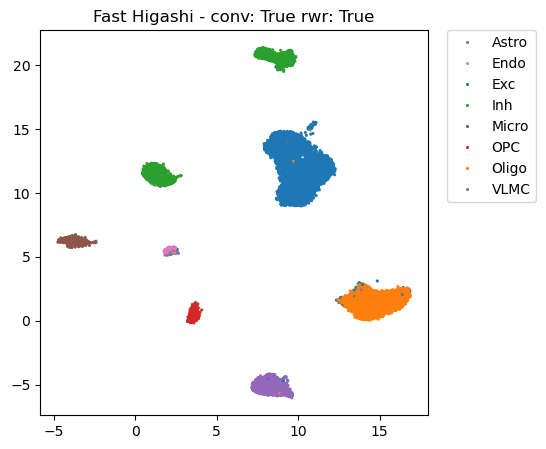

In [57]:
# fetch trained embeddings
from umap import UMAP
import seaborn as sns
import matplotlib.pyplot as plt

ct = np.array(fh_model.restore_order_fun(fh_model.label_info['major_cell_type']))
# print (len(ct), np.sum(ct != 'NaN'))
for conv in [True]:
    for rwr in [True]:
        embedding = embedding_all[(conv, rwr)]
        vec = UMAP(n_components=2, metric='cosine', random_state=0).fit_transform(embedding['embed_l2_norm_correct_coverage_fh'])
        fig = plt.figure(figsize=(5, 5))
        # mm1 = cell_type <= 30000
        ax = sns.scatterplot(x=vec[:, 0], y=vec[:, 1], s=5, alpha=1.0, linewidth=0, hue=ct)
        handles, labels = ax.get_legend_handles_labels()
        labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
        ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1)
        ax.title.set_text(f"Fast Higashi - conv: {conv} rwr: {rwr}")
        
        
final_cell_embed = embedding_all[(True, True)]['embed_l2_norm_correct_coverage_fh']
np.save(f'{data_dir}/cell_embed.npy', final_cell_embed)

In [58]:
import anndata
adata = anndata.AnnData(X=embedding['embed_l2_norm_correct_coverage_fh'])
adata.obs.index = np.array(fh_model.restore_order_fun(fh_model.label_info['cell_name_higashi']))
adata.obs['cell_type'] = ct

In [59]:
adata.write(f"{data_dir}/fh_embedding_v2.h5ad")

## hicluster - chromvar - hic

### hicluster

In [18]:
import pickle
import cooler
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm as cm
import seaborn as sns
from scipy.sparse import csr_matrix
import anndata

mpl.style.use('default')
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
# mpl.rcParams['font.family'] = 'sans-serif'
# mpl.rcParams['font.sans-serif'] = 'Helvetica'

In [21]:


# adata = anndata.read_h5ad(f"{data_dir}/fh_embedding_v2.h5ad")
# adata.obs['cell_type']

label_info = pickle.load(open(f"{data_dir}/label_info.pickle", "rb"))
filelist = open(os.path.join(data_dir,  'filelist.txt'), 'r').readlines()
filelist = [l.strip() for l in filelist]
contact_tab = pd.DataFrame({'cell id': label_info['cell_name_higashi'], 
                            'path': filelist})


In [22]:
contact_tab

,cell id,path
0,"hPFC-lib-1_A1,A7",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/2127...
1,"hPFC-lib-1_A1,C5",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/6675...
2,"hPFC-lib-1_A1,C8",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/6675...
3,"hPFC-lib-1_A1,C12",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/6675...
4,"hPFC-lib-1_A1,D2",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/6675...
...,...,...
23271,"hPFC-lib-45_H12,A12",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/7835...
23272,"hPFC-lib-45_H12,B9",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/7835...
23273,"hPFC-lib-45_H12,E11",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/7845...
23274,"hPFC-lib-45_H12,F11",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/7845...


In [23]:
contact_tab.to_csv(f"{data_dir}/contact_table_impute.tsv", sep='\t', index=False, header=False)

In [24]:
contact_tab

,cell id,path
0,"hPFC-lib-1_A1,A7",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/2127...
1,"hPFC-lib-1_A1,C5",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/6675...
2,"hPFC-lib-1_A1,C8",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/6675...
3,"hPFC-lib-1_A1,C12",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/6675...
4,"hPFC-lib-1_A1,D2",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/6675...
...,...,...
23271,"hPFC-lib-45_H12,A12",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/7835...
23272,"hPFC-lib-45_H12,B9",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/7835...
23273,"hPFC-lib-45_H12,E11",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/7845...
23274,"hPFC-lib-45_H12,F11",/ewsc/zhangruo/GAGE_seq_AD//filtered_pair/7845...


! # bash

hicluster filter-contact --output_dir rmbkl/ --blacklist_1d_path /ewsc/zhangruo/hg38/hg38_blacklist_yangzhang.bed --chr1 0 --pos1 1 --chr2 2 --pos2 3 --contact_table contact_table_impute.tsv --chrom_size_path /ewsc/zhangruo/hg38_short.chrom.sizes.txt

In [25]:
def logistic_one_cell(cell):
    pairs = pd.read_csv(os.path.join(data_dir, 
                                     'rmbkl', 
                                     f'{cell}.contact.rmbkl.tsv.gz'), sep='\t', header=None)
    pairs = pairs.groupby(0)
    stats = []
    for chrom in chroms:
        try:
            tp = pairs.get_group(chrom)
        except:
            stats.append(0)
            continue
        tp = tp[tp[0] == tp[2]]
        # tp['bin1'] = tp[1] // 1000000
        # tp['bin2'] = tp[3] // 1000000
        stats.append(np.sum(np.abs(tp[3] - tp[1]) > 100000))
    return stats

def coverage(cell):
    pairs = pd.read_csv(os.path.join(data_dir, 
                                     'rmbkl', 
                                     f'{cell}.contact.rmbkl.tsv.gz'), sep='\t', header=None)
    pairs = pairs.groupby(0)
    stats = []
    for chrom in chroms:
        try:
            tp = pairs.get_group(chrom)
        except:
            stats.append(0)
            continue
        tp = tp[tp[0] == tp[2]]
        bins = np.concatenate([np.array(tp[1] // 10000), np.array(tp[3] // 10000)], axis=0)
        stats.append(len(np.unique(bins)))
    return stats

from tqdm.contrib.concurrent import *

stats_all = process_map(logistic_one_cell, contact_tab['cell id'], max_workers=32,
                       total = len(contact_tab.index))
coverage_all =  process_map(coverage, contact_tab['cell id'], max_workers=32,
                       total = len(contact_tab.index))
contact_tab['read_count'] = np.sum(stats_all, axis=-1)




  0%|          | 0/23276 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
contact_tab

In [10]:
contact_tab = contact_tab[['cell id', 'path']]
contact_tab['path'] = [f'{data_dir}/rmbkl/{x}.contact.rmbkl.tsv.gz' for x in contact_tab['cell id']]

/tmp/ipykernel_2630860/378215796.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  contact_tab['path'] = [f'{data_dir}/rmbkl/{x}.contact.rmbkl.tsv.gz' for x in contact_tab['cell id']]


In [11]:
contact_tab.to_csv(f"{data_dir}/contact_table_rmbkl_all.tsv", sep='\t', index=False, header=False)

hicluster prepare-impute --cell_table contact_table_rmbkl_all.tsv --batch_size 1536 --pad 2 --cpu_per_job 200 --chr1 0 --pos1 1 --chr2 2 --pos2 3 --output_dir impute/10K/ --chrom_size_path /data/rzhang/hg38/hg38_short.chrom.sizes.txt --output_dist 5050000 --window_size 30000000 --step_size 10000000 --resolution 10000

### chromvar

In [5]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '7'
import scanpy as sc
import anndata
import cupy as cp
import cupyx as cpx
import time
# import rapids_singlecell as rsc
# from rapids_singlecell.cunnData import cunnData
from scipy.sparse import csr_matrix
import warnings
warnings.filterwarnings("ignore")
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator
rmm.reinitialize(
    managed_memory=True, # Allows oversubscription
    pool_allocator=True, # default is False
    devices=0, # GPU device IDs to register. By default registers only GPU 0.
)
import scprinter as scp
import anndata
import warnings
from scipy.stats import ttest_ind
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.sparse import *
import cooler
warnings.filterwarnings("ignore")
from concurrent.futures import *

In [7]:
work_dir = '/ewsc/zhangruo/GAGE_seq_AD/scATAC'


def parse_bin_name(bin_name):
    # e.g. "chr10:10000000" -> ("chr10", 10000000)
    chrom, start = bin_name.split(':')
    return chrom, int(start)

In [8]:
# for focus, focus_atac in zip(
#     ['Astro', 'Exc', 'Inh', 'Oligo', 'OPC', 'Micro'],
#     ['Ast', 'Exc', 'Inh', 'Oli', 'Opc', 'Mic']
# ):

In [10]:
focus = 'Astro'
focus_atac = 'Ast'

Fetching GC content:   0%|          | 0/101668 [00:00<?, ?it/s]

Sampling nearest neighbors
NNDescent (2500, 2)


Sampling background peaks:   0%|          | 0/2500 [00:00<?, ?it/s]

  0%|          | 0/203336 [00:00<?, ?it/s]

Computing expectation reads per cell and peak...


Processing TF chunks:   0%|          | 0/1 [00:00<?, ?it/s]

Processing chunks:   0%|          | 0/1 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/500 [00:00<?, ?it/s]

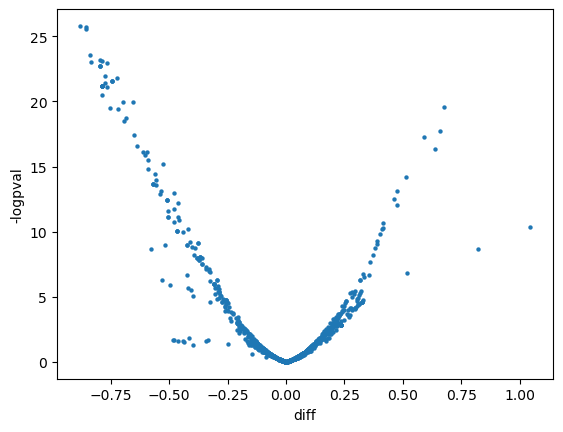

In [22]:


distance_min = 130000 // 10000
distance_max = 4096000 // 10000
valid_cell_label = pd.read_csv(f'{data_dir}/valid_cell_meta_filtered.csv')
# get atac, filter to get the cell type
atac_adata = anndata.read_h5ad(os.path.join(work_dir,f'CT_{focus_atac}_cleaned_cellxpeak.h5ad'))
atac_adata = atac_adata[atac_adata.obs['Celltype'] == focus_atac].copy()
cov = np.array(atac_adata.X.sum(axis=0)).reshape((-1)) > 0
atac_adata = atac_adata[:, cov].copy()
scp.chromvar.sample_bg_peaks(atac_adata, 
                         genome=scp.genome.hg38, 
                         method='chromvar', 
                         niterations=500)
motif = scp.motifs.FigR_Human_Motifs(scp.genome.hg38,
                                     bg=list(atac_adata.uns['bg_freq']), 
                                     n_jobs=100,
                                     pvalue=5e-5, mode='motifmatchr')
motif.prep_scanner(
    None,
    pvalue=5e-5,
)
motif.chromvar_scan(atac_adata)



# get atac-chromvar
chromvar = scp.chromvar.compute_deviations(atac_adata, chunk_size=50000, device='cuda')
chromvar.write(f'{work_dir}/{focus}_atac_chromvar.h5ad')

# differential test

groupby = 'ADdiag3types'
fg = chromvar[chromvar.obs[groupby] != 'nonAD']
bg = chromvar[chromvar.obs[groupby] == 'nonAD']
stat, pval = ttest_ind(fg.X, bg.X)
diff = fg.X.mean(axis=0) - bg.X.mean(axis=0)

pval = -np.log10(pval + 1e-50)
df = pd.DataFrame({'diff':diff, '-logpval':pval}, index=chromvar.var.index)

sns.scatterplot(x='diff', y='-logpval', data=df, linewidth=0, s=10)
df.to_csv(f'{work_dir}/{focus}_atac_chromvar_celltype_specific.tsv', sep='\t')

# get bagging by differential results between AD / CD
# bagging = scp.chromvar.bag_deviations(
#     adata=chromvar, ranked_df=df.sort_values('-logpval', ascending=False), cutoff=0.7, motif_motif_matrix=scp.datasets.FigR_motifs_bagging_human, 
#     collapse_greater=True
# )

bagging, groups = scp.chromvar.bag_deviations(
    adata=None, ranked_df=df.sort_values('-logpval', ascending=False), cutoff=0.7, motif_motif_matrix=scp.datasets.FigR_motifs_bagging_human, 
    collapse_greater=True
)
bagging = pd.DataFrame({'groups': groups}, index=bagging 
)
bagging.to_csv(f'{work_dir}/{focus}_motif_bagging_celltype_specific.tsv', sep='\t')

In [ ]:


# get peak2bin, bin2motif matching
peak = scp.utils.regionparser(list(atac_adata.var_names))
peak

peak['10k_start'] = peak['Start'] // 10000 * 10000
peak['10k_end'] = peak['10k_start'] + 10000
peak['index'] = np.arange(len(peak))
peak['10k_identifier'] = [f'{chrom}:{start}' for chrom,start  in zip(peak['Chromosome'], peak['10k_start'])]

peak_group = peak.groupby('10k_identifier')
ids = []
new_motif_mm = []
for g in tqdm(np.unique(peak['10k_identifier'])):
    df = peak_group.get_group(g)
    index = np.array(df['index'])
    ids.append(g)
    new_motif_mm.append(atac_adata.varm['motif_match'][index, :].mean(axis=0))
ids = np.array(ids)
bin_ids = np.copy(ids)
new_motif_mm = np.array(new_motif_mm)

new_motif_mm = (new_motif_mm > 0).astype('int')

bin2motif = pd.DataFrame(new_motif_mm, index=ids, columns=atac_adata.uns['motif_name'])

# now get hic coverage
valid_cell_label = pd.read_csv(f'{data_dir}/valid_cell_meta_filtered.csv')
valid_cell_label.index = valid_cell_label['index']
kept_cell_barcode = valid_cell_label[valid_cell_label['major_cell_type'] == focus].index
cell_table = pd.read_csv(f'{data_dir}/impute/10K/cell_table.tsv', header=None, sep='\t')
cell_table.index = cell_table[0]
cell_table = cell_table.loc[kept_cell_barcode].copy().reset_index(drop=True)



def parse_one_cell(i, cell_row):
    mtx_all = []
    for chrom in chroms:
        path = cell_row[1]
        path = str(path).replace('rzhang', 'zhangruo')
        name = cell_row[0]
        mtx = cooler.Cooler(path).matrix(sparse=True, balance=False).fetch(chrom)
        # mtx = cooler.Cooler(f'/ewsc/zhangruo/GAGE_seq_AD/raw_10k.10K.scool::cells/{name}').matrix(sparse=True, balance=False).fetch(chrom)
        row, col, data = mtx.row, mtx.col, mtx.data
        mask = (np.abs(col-row) >= distance_min) & (np.abs(col-row) <= distance_max)  # (data > min_thres) & 
        row, col, data = row[mask], col[mask], data[mask]
        mtx = csr_matrix((data, (row, col)), shape=mtx.shape)
        name = cell_row[0]
        cov = np.array(mtx.sum(axis=1)).reshape((-1))
        mtx_all.append(cov)
    mtx = np.concatenate(mtx_all)
    return cell_row[0], mtx
mtxs = []
ids = []

pool = ProcessPoolExecutor(max_workers=50)
p_list = []
for i,cell_row in tqdm(cell_table.iterrows(), total=len(cell_table)):
    p_list.append(pool.submit(parse_one_cell, i, cell_row))
bar = trange(len(cell_table))
ct = 0
for p in as_completed(p_list):
    if ct % 1000 == 0:
        bar.update(1000)
    ct += 1
    id, mtx = p.result()
    if mtx is not None:
        mtxs.append(mtx)
        ids.append(id)
used_bins = []
for chrom in tqdm(chroms):
    path = cell_table[1].iloc[0]
    path = str(path).replace('rzhang', 'zhangruo')
    mtx = cooler.Cooler(path).matrix(sparse=True, balance=False).fetch(chrom)
    for i in range(mtx.shape[0]):
        bin = int(i * 10000)
        name = f'{chrom}:{bin}'
        used_bins.append(name)
mtxs = np.array(mtxs)
# make bincov anndata
adata = anndata.AnnData(X=mtxs)
adata.obs.index = ids
adata.uns['motif_name']=atac_adata.uns['motif_name']
adata.var.index = used_bins
shared = list(set(adata.var.index) & set(bin2motif.index))
adata = adata[:, shared].copy()
adata.varm['motif_match'] = np.array(bin2motif.loc[shared])
new_index = []
for x in adata.var.index:
    chrom = x.split(":")[0]
    bin1 = int(x.split(":")[1])
    bin2 = bin1 + 10000
    new_index.append(f'{chrom}:{bin1}-{bin2}')
adata.var.index = new_index
valid_cell_label = pd.read_csv(f'{data_dir}/valid_cell_meta_filtered.csv')
valid_cell_label.index = valid_cell_label['index']
adata.obs['major'] = valid_cell_label['major_cell_type']
adata.obs['condition'] = valid_cell_label['condition']
adata.obs['sample_id'] = valid_cell_label['sample_id']
adata.obs['sex'] = valid_cell_label['sex']
adata.obs['sample_id'] = [f'{ct}_{x}' for ct, x in zip(adata.obs['condition'], adata.obs['sample_id'])]
adata.write(f'{work_dir}/{focus}_hic_coverage_celltype_specific.h5ad')
temp_adata = adata

# differential directly on covereage
groupby = 'condition'
fg = adata[adata.obs[groupby] != 'CT'].copy()
bg = adata[adata.obs[groupby] == 'CT'].copy()
fg.X = fg.X / fg.X.sum(axis=-1, keepdims=True)
bg.X = bg.X / bg.X.sum(axis=-1, keepdims=True)
stat, pval = ttest_ind(fg.X, bg.X)

diff = fg.X.mean(axis=0) - bg.X.mean(axis=0)

pval = -np.log10(pval + 1e-50)
df = pd.DataFrame({'diff':diff, '-logpval':pval}, index=adata.var.index)
df.to_csv(f'{work_dir}/{focus}_hic_coverage_differential_celltype_specific.tsv', sep='\t')
# sns.scatterplot(x='diff', y='-logpval', data=df, linewidth=0, s=10)
up = df[(df['diff'] > 0)].sort_values(['-logpval'], ascending=False).iloc[:100]
down = df[(df['diff'] < 0)].sort_values(['-logpval'], ascending=False).iloc[:100]
up_motif = adata[:, up.index].varm['motif_match'].sum(axis=1)
down_motif = adata[:, down.index].varm['motif_match'].sum(axis=1)


all_motif = np.concatenate([up_motif, down_motif], axis=0)
label = ['AD'] * len(up_motif) + ['CT'] * len(down_motif)

sns.violinplot(x=label, y=all_motif, hue=label)
plt.title('motif num')
plt.savefig(f'{work_dir}/{focus}_hiccoverage_motif_num.png')
plt.close('all')
bin2peak = {}
for i, row in peak.iterrows():
    bin1 = row['10k_identifier']
    chrom = bin1.split(":")[0]
    start1 = int(bin1.split(":")[1])
    end1 = start1 + 10000
    bin = f'{chrom}:{start1}-{end1}'
    if bin not in bin2peak:
        bin2peak[bin] = []
    bin2peak[bin].append(i)
up_cre = [len(bin2peak[x]) for x in up.index]
down_cre = [len(bin2peak[x]) for x in down.index]

all_motif = np.concatenate([up_cre, down_cre], axis=0)

label = ['AD'] * len(up_motif) + ['CT'] * len(down_motif)

sns.violinplot(x=label, y=all_motif, hue=label)
plt.title('CRE num')
plt.savefig(f'{work_dir}/{focus}_hiccoverage_cre_num.png')
plt.close('all')

# coverage chromvar
cov = temp_adata.X.sum(axis=0)
cov = np.array(cov).reshape((-1))
temp_adata = temp_adata[:, cov > 0]
scp.chromvar.sample_bg_peaks(temp_adata,
                             genome=scp.genome.hg38, 
                             method='chromvar', 
                             niterations=500,
                            )
chromvar_coverage = scp.chromvar.compute_deviations(temp_adata, device='cuda')
valid_cell_label = pd.read_csv(f'{data_dir}/valid_cell_meta_filtered.csv')
valid_cell_label.index = valid_cell_label['index']
chromvar_coverage.obs['major'] = valid_cell_label['major_cell_type']
chromvar_coverage.obs['sub'] = valid_cell_label['sub_cell_type']
chromvar_coverage.obs['condition'] = valid_cell_label['condition']
chromvar_coverage.obs['sample_id'] = valid_cell_label['sample_id']
chromvar_coverage.obs['sex'] = valid_cell_label['sex']
chromvar_coverage.obs['sample_id'] = [f'{ct}_{x}' for ct, x in zip(chromvar_coverage.obs['condition'], chromvar_coverage.obs['sample_id'])]
chromvar_coverage.obs['nnz'] = np.array((temp_adata.X > 0).sum(axis=-1)).reshape((-1))
chromvar_coverage.obs['input_coverage'] = np.array(temp_adata.X.sum(axis=-1)).reshape((-1))
chromvar_coverage.obs['total_activity'] = chromvar_coverage.X.sum(axis=1)

groupby = 'condition'
fg = chromvar_coverage[chromvar_coverage.obs[groupby] != 'CT']
bg = chromvar_coverage[chromvar_coverage.obs[groupby] == 'CT']
stat, pval = ttest_ind(fg.X, bg.X)

diff = fg.X.mean(axis=0) - bg.X.mean(axis=0)

pval = -np.log10(pval + 1e-50)
df = pd.DataFrame({'diff':diff, '-logpval':pval}, index=chromvar_coverage.var.index)
chromvar_coverage.write(f'{work_dir}/{focus}_hic_coverage_chromvar_celltype_specific.h5ad')
df.to_csv(f'{work_dir}/{focus}_hic_coverage_chromvar_differential_celltype_specific.tsv', sep='\t')


  0%|          | 0/61450 [00:00<?, ?it/s]

  0%|          | 0/2335 [00:00<?, ?it/s]

  0%|          | 0/2335 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

Fetching GC content:   0%|          | 0/60013 [00:00<?, ?it/s]

Sampling nearest neighbors
NNDescent (2500, 2)


Sampling background peaks:   0%|          | 0/2500 [00:00<?, ?it/s]

Computing expectation reads per cell and peak...


Processing TF chunks:   0%|          | 0/1 [00:00<?, ?it/s]

Processing chunks:   0%|          | 0/1 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/203336 [00:00<?, ?it/s]

  0%|          | 0/61450 [00:00<?, ?it/s]

chr1


  0%|          | 0/5664 [00:00<?, ?it/s]

chr10


  0%|          | 0/3052 [00:00<?, ?it/s]

chr11


  0%|          | 0/3473 [00:00<?, ?it/s]

chr12


  0%|          | 0/2919 [00:00<?, ?it/s]

chr13


  0%|          | 0/1623 [00:00<?, ?it/s]

chr14


  0%|          | 0/2092 [00:00<?, ?it/s]

chr15


  0%|          | 0/2037 [00:00<?, ?it/s]

chr16


  0%|          | 0/2022 [00:00<?, ?it/s]

chr17


  0%|          | 0/2518 [00:00<?, ?it/s]

chr18


  0%|          | 0/1497 [00:00<?, ?it/s]

chr19


  0%|          | 0/1938 [00:00<?, ?it/s]

chr2


  0%|          | 0/4837 [00:00<?, ?it/s]

chr20


  0%|          | 0/1646 [00:00<?, ?it/s]

chr21


  0%|          | 0/647 [00:00<?, ?it/s]

chr22


  0%|          | 0/1208 [00:00<?, ?it/s]

chr3


  0%|          | 0/3993 [00:00<?, ?it/s]

chr4


  0%|          | 0/3018 [00:00<?, ?it/s]

chr5


  0%|          | 0/3535 [00:00<?, ?it/s]

chr6


  0%|          | 0/3510 [00:00<?, ?it/s]

chr7


  0%|          | 0/3206 [00:00<?, ?it/s]

chr8


  0%|          | 0/2878 [00:00<?, ?it/s]

chr9


  0%|          | 0/2701 [00:00<?, ?it/s]

chrX


  0%|          | 0/1436 [00:00<?, ?it/s]

  0%|          | 0/2335 [00:00<?, ?it/s]

  0%|          | 0/2335 [00:00<?, ?it/s]

Fetching GC content:   0%|          | 0/590156 [00:00<?, ?it/s]

Fetching GC content:   0%|          | 0/590156 [00:00<?, ?it/s]

Sampling nearest neighbors
NNDescent (2500, 2)


Sampling background peaks:   0%|          | 0/2500 [00:00<?, ?it/s]

/ewsc/zhangruo/miniforge3/envs/seq2print/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/ewsc/zhangruo/miniforge3/envs/seq2print/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/ewsc/zhangruo/miniforge3/envs/seq2print/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/ewsc/zhangruo/miniforge3/envs/seq2print/lib/python3.11/site-packages/anndata/utils.py:434: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/ewsc/zhangruo/miniforge3/envs/seq2print/lib/python3.11/site-packages/anndata/util

(590156, 632)
AnnData object with n_obs × n_vars = 2335 × 590156
    var: 'gc_1', 'gc_2', 'distance', 'reads_per_peak'
    uns: 'motif_name'
    varm: 'bg_peaks', 'motif_match'
Computing expectation reads per cell and peak...


Processing chunks:   0%|          | 0/5 [00:00<?, ?it/s]

(590156, 632)
AnnData object with n_obs × n_vars = 2335 × 590156
    var: 'gc_1', 'gc_2', 'distance', 'reads_per_peak'
    uns: 'motif_name'
    varm: 'bg_peaks', 'motif_match'
Computing expectation reads per cell and peak...
(590156, 626)
AnnData object with n_obs × n_vars = 2335 × 590156
    var: 'gc_1', 'gc_2', 'distance', 'reads_per_peak'
    uns: 'motif_name'
    varm: 'bg_peaks', 'motif_match'
Computing expectation reads per cell and peak...


Processing TF chunks:   0%|          | 0/7 [00:00<?, ?it/s]

(590156, 632)
AnnData object with n_obs × n_vars = 2335 × 590156
    var: 'gc_1', 'gc_2', 'distance', 'reads_per_peak'
    uns: 'motif_name'
    varm: 'bg_peaks', 'motif_match'
Computing expectation reads per cell and peak...
(590156, 632)
AnnData object with n_obs × n_vars = 2335 × 590156
    var: 'gc_1', 'gc_2', 'distance', 'reads_per_peak'
    uns: 'motif_name'
    varm: 'bg_peaks', 'motif_match'
Computing expectation reads per cell and peak...
(590156, 632)
AnnData object with n_obs × n_vars = 2335 × 590156
    var: 'gc_1', 'gc_2', 'distance', 'reads_per_peak'
    uns: 'motif_name'
    varm: 'bg_peaks', 'motif_match'
Computing expectation reads per cell and peak...
(590156, 632)
AnnData object with n_obs × n_vars = 2335 × 590156
    var: 'gc_1', 'gc_2', 'distance', 'reads_per_peak'
    uns: 'motif_name'
    varm: 'bg_peaks', 'motif_match'
Computing expectation reads per cell and peak...
(590156, 632)
AnnData object with n_obs × n_vars = 2335 × 590156
    var: 'gc_1', 'gc_2', 'dista



Processing chunks:   0%|          | 0/5 [00:00<?, ?it/s]

Processing chunks:   0%|          | 0/5 [00:00<?, ?it/s]

Processing background peaks:   0%|          | 2/500 [00:00<01:36,  5.19it/s]

Processing background peaks:   1%|          | 3/500 [00:00<01:31,  5.41it/s]

Processing background peaks:   1%|          | 4/500 [00:00<01:29,  5.53it/s]

Processing background peaks:   1%|          | 5/500 [00:00<01:28,  5.60it/s]

Processing background peaks:   1%|          | 6/500 [00:01<01:27,  5.64it/s]

Processing background peaks:   1%|▏         | 7/500 [00:01<01:27,  5.66it/s]

Processing background peaks:   2%|▏         | 8/500 [00:01<01:26,  5.68it/s]

Processing background peaks:   2%|▏         | 9/500 [00:01<01:26,  5.70it/s]

Processing background peaks:   2%|▏         | 10/500 [00:01<01:25,  5.71it/s]

Processing background peaks:   2%|▏         | 11/500 [00:01<01:25,  5.71it/s]

Processing background peaks:   2%|▏         | 12/500 [00:02<01:25,  5.71it/s]

Processing background

In [12]:
pool = ProcessPoolExecutor(max_workers=8)
for i in range(8):
    start = i
    command = f"CUDA_VISIBLE_DEVICES={i} python /ewsc/zhangruo/scPrinter/scprinter/hic_chromvar.py {work_dir}/hic_chromvar_input_part{start}_v3.h5ad"
    import os
    pool.submit(os.system, command)
pool.shutdown(wait=True)
chromvar_pair = []
for i in range(8):
    chromvar_pair.append(anndata.read_h5ad(
        os.path.join(work_dir, f'hic_chromvar_input_part{i}_v3.h5ad' + ".chromvar_pair.h5ad")))
chromvar_pair = anndata.concat(chromvar_pair, axis=1)
chromvar_pair

valid_cell_label = pd.read_csv(f'{data_dir}/valid_cell_meta_filtered.csv')
valid_cell_label.index = valid_cell_label['index']
chromvar_pair.obs['major'] = valid_cell_label['major_cell_type']
chromvar_pair.obs['condition'] = valid_cell_label['condition']
chromvar_pair.obs['sample_id'] = valid_cell_label['sample_id']
chromvar_pair.obs['sex'] = valid_cell_label['sex']
chromvar_pair.obs['sample_id'] = [f'{ct}_{x}' for ct, x in zip(chromvar_pair.obs['condition'], chromvar_pair.obs['sample_id'])]
groupby = 'condition'
fg = chromvar_pair[chromvar_pair.obs[groupby] != 'CT']
bg = chromvar_pair[chromvar_pair.obs[groupby] == 'CT']
stat, pval = ttest_ind(fg.X, bg.X)

diff = fg.X.mean(axis=0) - bg.X.mean(axis=0)

pval = -np.log10(pval + 1e-50)
df = pd.DataFrame({'diff':diff, '-logpval':pval}, index=chromvar_pair.var.index)
chromvar_pair.write(f'{work_dir}/{focus}_hic_pair_chromvar_celltype_specific.h5ad')
df.to_csv(f'{work_dir}/{focus}_hic_pair_chromvar_differential_celltype_specific.tsv', sep='\t')



KeyboardInterrupt



## Hicluster - loop calling

In [17]:
import pickle
import cooler
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm as cm
import seaborn as sns
from scipy.sparse import csr_matrix
import anndata

mpl.style.use('default')
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
# mpl.rcParams['font.family'] = 'sans-serif'
# mpl.rcParams['font.sans-serif'] = 'Helvetica'

adata = anndata.read_h5ad(f"{data_dir}/fh_embedding_v2.h5ad")
adata.obs['cell_type']

label_info = pickle.load(open(f"{data_dir}/label_info.pickle", "rb"))
filelist = open(os.path.join(data_dir,  'filelist.txt'), 'r').readlines()
filelist = [l.strip() for l in filelist]
contact_tab = pd.DataFrame({'cell id': label_info['cell_name_higashi'], 
                            'path': filelist})


In [65]:
contact_tab.to_csv(f"{data_dir}/contact_table_impute.tsv", sep='\t', index=False, header=False)

In [18]:
contact_tab

,cell id,path
0,"hPFC-lib-44_B6,D7",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/844172...
1,"hPFC-lib-43_H5,C1",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/207800...
2,"hPFC-lib-4_D7,D1",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/667543...
3,"hPFC-lib-28_F10,C2",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/207800...
4,"hPFC-lib-16_B8,D10",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/667543...
...,...,...
23820,"hPFC-lib-44_E5,D11",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/844172...
23821,"hPFC-lib-1_C9,A11",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/212723...
23822,"hPFC-lib-3_H2,G12",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/851719...
23823,"hPFC-lib-8_F12,B2",/ewsc/rzhang/GAGE_seq_AD//filtered_pair/767334...


! # bash

hicluster filter-contact --output_dir rmbkl/ --blacklist_1d_path /data/rzhang/hg38/hg38_blacklist_yangzhang.bed --chr1 0 --pos1 1 --chr2 2 --pos2 3 --contact_table contact_table_impute.tsv --chrom_size_path /data/rzhang/hg38/hg38_short.chrom.sizes.txt

In [19]:
def logistic_one_cell(cell):
    pairs = pd.read_csv(os.path.join(data_dir, 
                                     'rmbkl', 
                                     f'{cell}.contact.rmbkl.tsv.gz'), sep='\t', header=None)
    pairs = pairs.groupby(0)
    stats = []
    for chrom in chroms:
        try:
            tp = pairs.get_group(chrom)
        except:
            stats.append(0)
            continue
        tp = tp[tp[0] == tp[2]]
        # tp['bin1'] = tp[1] // 1000000
        # tp['bin2'] = tp[3] // 1000000
        stats.append(np.sum(np.abs(tp[3] - tp[1]) > 100000))
    return stats

def coverage(cell):
    pairs = pd.read_csv(os.path.join(data_dir, 
                                     'rmbkl', 
                                     f'{cell}.contact.rmbkl.tsv.gz'), sep='\t', header=None)
    pairs = pairs.groupby(0)
    stats = []
    for chrom in chroms:
        try:
            tp = pairs.get_group(chrom)
        except:
            stats.append(0)
            continue
        tp = tp[tp[0] == tp[2]]
        bins = np.concatenate([np.array(tp[1] // 10000), np.array(tp[3] // 10000)], axis=0)
        stats.append(len(np.unique(bins)))
    return stats

from tqdm.contrib.concurrent import *

stats_all = process_map(logistic_one_cell, contact_tab['cell id'], max_workers=32,
                       total = len(contact_tab.index))
coverage_all =  process_map(coverage, contact_tab['cell id'], max_workers=32,
                       total = len(contact_tab.index))
contact_tab['read_count'] = np.sum(stats_all, axis=-1)


chrom_length = pd.read_csv("/data/rzhang/Higashi/hg38.chrom.sizes.txt", sep='\t', header=None)
chrom_length.index = chrom_length[0]
lengths = np.array(chrom_length.loc[chroms][1])
lengths
average = 50000 / np.sum(lengths) * lengths
kept = np.sum(np.array(stats_all) >= average[None], axis=1) == 22
kept
coverage = np.array(coverage_all) / (lengths // 10000)



  0%|          | 0/23825 [00:00<?, ?it/s]

  0%|          | 0/23825 [00:00<?, ?it/s]

In [20]:
coverage = np.array(coverage_all) / (lengths // 10000)

In [21]:
np.array(stats_all)[kept]

array([[13133, 13068, 13160, ...,  2018,  1773,  1008],
       [33465, 41222, 37084, ...,  5971,  4374,  2713],
       [18274, 20851, 18199, ...,  3362,  2209,  1284],
       ...,
       [17963, 21458, 18488, ...,  3094,  2281,  1188],
       [34702, 40030, 34306, ...,  6237,  5070,  2619],
       [12633, 11455, 13767, ...,  2332,  1680,  1002]])

In [22]:
np.sum(kept), len(kept)

(6993, 23825)

In [23]:
contact_tab = contact_tab[kept]

In [24]:
contact_tab = contact_tab[['cell id', 'path']]
contact_tab['path'] = [f'{data_dir}/rmbkl/{x}.contact.rmbkl.tsv.gz' for x in contact_tab['cell id']]

In [73]:
contact_tab.to_csv(f"{data_dir}/contact_table_rmbkl.tsv", sep='\t', index=False, header=False)



% impute


hicluster prepare-impute --cell_table contact_table_rmbkl.tsv --batch_size 1536 --pad 2 --cpu_per_job 200 --chr1 0 --pos1 1 --chr2 2 --pos2 3 --output_dir impute/10K/ --chrom_size_path /data/rzhang/hg38/hg38_short.chrom.sizes.txt --output_dist 5050000 --window_size 30000000 --step_size 10000000 --resolution 10000

% merge raw for blacklist

hicluster merge-cell-raw --cell_table contact_table_rmbkl.tsv --chrom_size_path /data/rzhang/hg38/hg38_short.chrom.sizes.txt --output_file all_raw_10k.cool --chr1 0 --pos1 1 --chr2 2 --pos2 3 --resolution 10000

In [25]:
import copy
from  glob import glob
contact_tab = pd.read_csv(f"{data_dir}/contact_table_rmbkl.tsv", sep='\t', header=None)
coollist = glob(f'{data_dir}/impute/10K/*/*.cool')
cell_table = pd.DataFrame(coollist, index=[xx.split('/')[-1].replace('.cool', '') for xx in coollist], columns=['cool_path'])

In [26]:
cell_table = cell_table.loc[contact_tab.iloc[:, 0]]

In [27]:
cell_table

,cool_path
"hPFC-lib-43_H5,C1",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk0/hP...
"hPFC-lib-4_D7,D1",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk0/hP...
"hPFC-lib-28_F10,C2",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk0/hP...
"hPFC-lib-16_B8,D10",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk0/hP...
"hPFC-lib-29_A10,A10",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk0/hP...
...,...
"hPFC-lib-6_C11,D5",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk4/hP...
"hPFC-lib-20_E12,F9",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk4/hP...
"hPFC-lib-3_C6,H8",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk4/hP...
"hPFC-lib-34_A7,D8",/ewsc/rzhang/GAGE_seq_AD//impute/10K/chunk4/hP...


In [28]:
valid_cell_label = pd.read_csv(f'{data_dir}/valid_cell_meta_filtered.csv')
valid_cell_label.index = valid_cell_label['index']

In [29]:
cell_table['cluster'] = 'all'
cell_table2 = copy.deepcopy(cell_table)
cell_table2['cluster'] = np.array(valid_cell_label['major_cell_type'].loc[cell_table2.index])
cell_table3 = copy.deepcopy(cell_table)
cell_table3['cluster'] = np.array(valid_cell_label['sub_cell_type'].loc[cell_table2.index])
cell_table = pd.concat([cell_table, cell_table2, cell_table3], axis=0)
cell_table = cell_table[['cool_path', 'cluster']]

In [30]:
cell_table['cluster'] = [xx.replace('/', '_').replace(' ', '_') for xx in cell_table['cluster']]

In [31]:
cell_table['cluster'].unique()

array(['all', 'Exc', 'Astro', 'OPC', 'Micro', 'Oligo', 'VLMC', 'Inh',
       'Endo', 'Exc_L5_IT', 'Exc_L2_3_IT', 'Exc_L4_IT', 'Exc_L6b',
       'Inh_Pvalb', 'Inh_Lamp5', 'Inh_Vip', 'Exc_L6_IT_Car3', 'Inh_Sst',
       'Inh_Chandelier', 'Exc_L5_6_NP', 'Exc_L6_CT', 'Inh_Sncg',
       'Inh_PAX6', 'Exc_L6_IT', 'Exc_L5_ET'], dtype=object)

In [32]:
import cooler
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm as cm
import seaborn as sns
from scipy.sparse import csr_matrix

cool = cooler.Cooler(f'{data_dir}/all_raw_10k.cool')
data = cool.pixels()[:]
data = csr_matrix((data['count'], (data['bin1_id'], data['bin2_id'])), shape=cool.shape)
bin_df = cool.bins()[:]
bin_df['rowsum'] = data.sum(axis=0).A1

<Axes: xlabel='rowsum', ylabel='Count'>

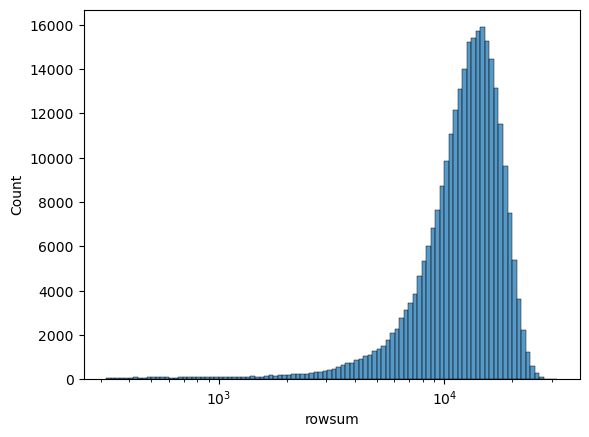

In [33]:
sns.histplot(bin_df.loc[bin_df['rowsum']>0, 'rowsum'], bins=100, log_scale=10, binrange=(2.5,4.5))

In [34]:
bin_df

,chrom,start,end,rowsum
0,chr1,0,10000,0
1,chr1,10000,20000,0
2,chr1,20000,30000,0
3,chr1,30000,40000,0
4,chr1,40000,50000,0
...,...,...,...,...
308832,chr21,46660000,46670000,14677
308833,chr21,46670000,46680000,18196
308834,chr21,46680000,46690000,4682
308835,chr21,46690000,46700000,491


In [35]:
((bin_df['rowsum']<1e3)).sum()

27071

In [36]:
bin_df[['chrom', 'start', 'end']].to_csv(f'{data_dir}/hg38.main.10kb.bed', sep='\t', header=False, index=False)
bin_df.loc[bin_df['rowsum']<1e3, ['chrom', 'start', 'end']].to_csv(f'{data_dir}/hg38.main.rowsum1000.10kb.bed', sep='\t', header=False, index=False)

In [37]:
cell_table['size'] = [os.stat(file_path).st_size /(1024*1024) for file_path in cell_table['cool_path']]

In [38]:
cell_table = cell_table.iloc[:, :2]

In [39]:
outdir = 'loop/'
loop_dir = f'{data_dir}/{outdir}'
params = {
    'cpu': 250,
    'resolution': 10000,
    'chrom_size_path': f'"/data/rzhang/hg38/hg38_short.chrom.sizes.txt"',
    'black_list_path': f'"{data_dir}/hg38.main.rowsum1000.10kb.bed"',
}

import schicluster
PACKAGE_DIR = schicluster.__path__[0]
with open(f'{PACKAGE_DIR}/loop/snakemake_template_loop.txt') as tmp:
    GENERATE_MATRIX_CHUNK_TEMPLATE = tmp.read()

In [63]:
def prepare_dir(output_dir, chunk_df, template, params):

    os.makedirs(output_dir, exist_ok=True)
    cell_table_path = f'{output_dir}cell_table.csv'
    chunk_df.to_csv(cell_table_path, header=False, index=True)
    params_str = '\n'.join(f'{k} = {v}' for k, v in params.items())

    with open(f'{output_dir}Snakefile_master', 'w') as f:
        f.write(params_str + template)
    return
    
for cluster, sub_df in cell_table.groupby('cluster'):
    if sub_df.shape[0]<25:
        continue
    print (cluster, sub_df.shape[0])
    tmp = sub_df.copy()
    prepare_dir(f'{loop_dir}{cluster}/', tmp, GENERATE_MATRIX_CHUNK_TEMPLATE, params)
with open(f'{loop_dir}snakemake_cmds.txt', 'w') as f:
    for cluster, sub_df in cell_table.groupby('cluster'):
        cluster_dir = f'{loop_dir}{cluster}'
        f.write(f'snakemake -d {cluster_dir} -s {cluster_dir}/Snakefile_master -j {params["cpu"]}\n')
        

Astro 1144
Endo 254
Exc 3058
Exc_L2_3_IT 1939
Exc_L4_IT 525
Exc_L5_6_NP 39
Exc_L5_IT 327
Exc_L6_CT 65
Exc_L6_IT_Car3 44
Exc_L6b 96
Inh 1112
Inh_Chandelier 46
Inh_Lamp5 140
Inh_PAX6 33
Inh_Pvalb 348
Inh_Sncg 131
Inh_Sst 121
Inh_Vip 293
Micro 684
OPC 608
Oligo 2834
VLMC 122
all 6993


In [43]:
for cluster, sub_df in cell_table.groupby('cluster'):
    if sub_df.shape[0]>=25:
        group = cluster
        loop = pd.read_csv(f'{loop_dir}/{group}/{group}/{group}.loop.bedpe', sep='\t', header=None)
        print (cluster, len(loop))

Astro 213032
Endo 284817
Exc 460181
Exc_L2_3_IT 454736
Exc_L4_IT 712741
Exc_L5_6_NP 9299
Exc_L5_IT 636787
Exc_L6_CT 63226
Exc_L6_IT_Car3 17577
Exc_L6b 225828
Inh 315590
Inh_Chandelier 9687
Inh_Lamp5 223135
Inh_PAX6 2266
Inh_Pvalb 404893
Inh_Sncg 87583
Inh_Sst 125418
Inh_Vip 312071
Micro 294288
OPC 708944
Oligo 253620
VLMC 5239
all 243246


In [385]:
for i in range(0, 9):
    if i == 1:
        continue
    group = f'leiden_{i}'
    nnzs = []
    for chrom in chroms:
        E = cooler.Cooler(f'{loop_res_dir}/{group}/{group}/{group}.E.cool').matrix(balance=False).fetch(f'{chrom}')
        nnzs.append(np.sum(E>0))
        
    print (group, nnzs)

leiden_0 [475950, 557424, 702062, 612214, 569070, 481430, 328810, 336984, 367680, 312284, 282278, 310000, 459562, 246374, 120816, 107642, 83416, 203428, 26734, 86142, 277614, 9314]
leiden_2 [712998, 799418, 808550, 767564, 811468, 739800, 458496, 482854, 385412, 348852, 392436, 370566, 534890, 372070, 197022, 160210, 105244, 334974, 25306, 91118, 145472, 29458]
leiden_3 [1393436, 1673168, 1671994, 1849732, 1453624, 1429284, 913712, 1005726, 881238, 765364, 739958, 785564, 1115964, 823826, 306490, 311330, 133906, 672908, 28768, 208360, 355794, 33592]
leiden_4 [485832, 713286, 655248, 591844, 682670, 608266, 374870, 455784, 292138, 369106, 260224, 404106, 399064, 262868, 176886, 120588, 93020, 185358, 33310, 90666, 110360, 19674]
leiden_5 [932024, 1111080, 1045570, 966308, 980498, 908354, 637716, 603318, 566490, 485566, 540716, 529468, 665264, 580400, 267578, 225390, 110076, 399504, 22688, 133668, 202960, 40628]
leiden_6 [98590, 141670, 130628, 89968, 133432, 111188, 77562, 63690, 65456,

In [362]:
import cooler
loop_res_dir = '/ewsc/rzhang/loop'
group = 'leiden_8'
chrom = 'chr1'
start = 62950000
end = 68300000
E = cooler.Cooler(f'{loop_res_dir}/{group}/{group}/{group}.E.cool').matrix(balance=False).fetch(f'{chrom}')
print (np.sum(E>0))
Q = cooler.Cooler(f'{loop_res_dir}/{group}/{group}/{group}.Q.cool').matrix(balance=False).fetch(f'{chrom}:{start}-{end}')
E = cooler.Cooler(f'{loop_res_dir}/{group}/{group}/{group}.E.cool').matrix(balance=False).fetch(f'{chrom}:{start}-{end}') #(global)
T = cooler.Cooler(f'{loop_res_dir}/{group}/{group}/{group}.T.cool').matrix(balance=False).fetch(f'{chrom}:{start}-{end}') #(local)
E_shuffle= cooler.Cooler(f'{loop_res_dir}/{group}/shuffle/{group}/{group}.E.cool').matrix(balance=False).fetch(f'{chrom}:{start}-{end}') #(global)'
T_shuffle= cooler.Cooler(f'{loop_res_dir}/{group}/shuffle/{group}/{group}.T.cool').matrix(balance=False).fetch(f'{chrom}:{start}-{end}') #(global)'

1565416


In [353]:
import pandas as pd
loop = pd.read_table(f'{loop_res_dir}/{group}/{group}/{group}.loop.bedpe', header=None)
loop = loop[(loop[0] == chrom) & (loop[1] >= start) & (loop[2] <= end) & (loop[4] >= start) & (loop[5] <= end)]
loop

,0,1,2,3,4,5,6
599,chr1,63530000,63540000,chr1,64240000,64250000,0.012013
600,chr1,63540000,63550000,chr1,64240000,64250000,0.019703
601,chr1,63600000,63610000,chr1,64230000,64240000,0.223409
602,chr1,63600000,63610000,chr1,64240000,64250000,0.235874
603,chr1,63600000,63610000,chr1,64250000,64260000,0.192252
...,...,...,...,...,...,...,...
815,chr1,67550000,67560000,chr1,67760000,67770000,0.121315
816,chr1,67550000,67560000,chr1,67770000,67780000,0.009228
817,chr1,67560000,67570000,chr1,67750000,67760000,0.057503
818,chr1,67560000,67570000,chr1,67760000,67770000,0.011591


In [354]:
loop2 = ((np.array(loop)[:, [1,4]] - start) / 10000).astype('int')

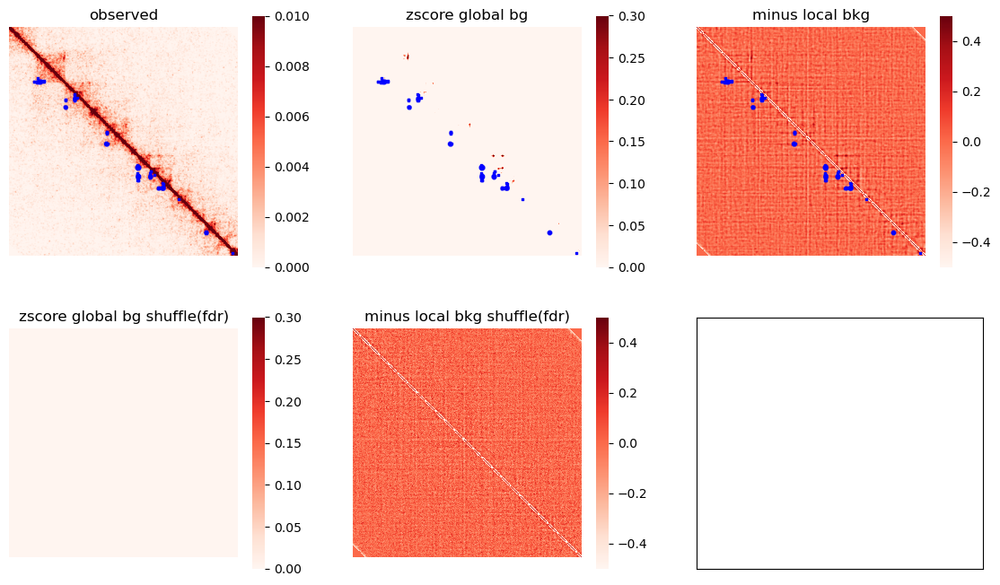

In [355]:
import seaborn as sns
import matplotlib.pyplot as plt
fig, axs = plt.subplots(2, 3, figsize=(14, 8))
axs = np.array(list(axs)).reshape((-1))
sns.heatmap(Q, cmap='Reds', vmin=0, vmax=0.01, ax=axs[0], square=True)
axs[0].set_title("observed")
for l in loop2:
    tp_x, tp_y = l[0], l[1]
    axs[0].scatter(tp_x, tp_y, marker='s', s=2, c='blue')
    
sns.heatmap(E, cmap='Reds',vmin=0, vmax=0.3, ax=axs[1], square=True)
axs[1].set_title("zscore global bg")

for l in loop2:
    tp_x, tp_y = l[0], l[1]
    axs[1].scatter(tp_x, tp_y, marker='s', s=2, c='blue')
    
sns.heatmap(T, cmap='Reds', vmin=-0.5, vmax=0.5,ax=axs[2], square=True)
axs[2].set_title("minus local bkg")


for l in loop2:
    tp_x, tp_y = l[0], l[1]
    axs[2].scatter(tp_x, tp_y, marker='s', s=2, c='blue')
    
    
sns.heatmap(E_shuffle, cmap='Reds',vmin=0, vmax=0.3, ax=axs[3], square=True)
axs[3].set_title("zscore global bg shuffle(fdr)")
sns.heatmap(T_shuffle, cmap='Reds', vmin=-0.5, vmax=0.5,ax=axs[4], square=True)
axs[4].set_title("minus local bkg shuffle(fdr)")
for ax in axs:
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
# break

## Now start Higashi - 500kb

In [10]:

config = f'{data_dir}/config_dir/config_gage_ad_higashi_500Kb.JSON'
config_info = {
    "data_dir": f"{data_dir}",
    "structured": True,
    "header_included": False,
    "contact_header": ["chrom1", "pos1", "chrom2", "pos2"],
    "input_format": 'higashi_v2',
    "temp_dir": f"{data_dir}/temp_500k",
    "genome_reference_path": "/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/hg38.chrom.sizes.txt",
    "cytoband_path": "/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/cytoBand_hg38.txt",
    "chrom_list": ["chr1", "chr2","chr3","chr4","chr5",
                   "chr6","chr7","chr8","chr9","chr10",
                   "chr11","chr12","chr13","chr14","chr15",
                   "chr16","chr17","chr18","chr19","chr20",
                   "chr21","chr22"],
    "resolution": 500000,
    "resolution_cell": 500000,
    "embedding_name": "test",
    "minimum_distance": 500000,
    "maximum_distance": -1,
    "local_transfer_range": 0,
    "loss_mode": "zinb",
    "dimensions": 256,
    "impute_list":["chr1", "chr2","chr3","chr4","chr5",
                   "chr6","chr7","chr8","chr9","chr10",
                   "chr11","chr12","chr13","chr14","chr15",
                   "chr16","chr17","chr18","chr19","chr20",
                   "chr21","chr22"],
    "neighbor_num": 5,
    "cpu_num": 32,
    "gpu_num": 6,
    "embedding_epoch":60,
    "correct_be_impute": False,
    "persample_id":"disease_group",
    "within_sample_nbr": True,
    "pre_cell_embed": f'{data_dir}/rna_cell_embedding.npy'
}
import json
with open(config,"w") as f:
    json.dump(config_info, f, indent = 6)
from higashi.Higashi_wrapper import *
# from fasthigashi.FastHigashi_Wrapper import *
higashi_model = Higashi(config)
higashi_model.process_data()

generating start/end dict for chromosome
extracting from filelist.txt


  0%|          | 0/23276 [00:00<?, ?it/s]

generating contact maps for baseline
data loaded
1087444625 False
chr1 split_num 30
chr2 split_num 38
chr3 split_num 30
chr4 split_num 31
chr5 split_num 27
chr6 split_num 26
chr7 split_num 21
chr8 split_num 20
chr9 split_num 12
chr10 split_num 17
chr11 split_num 16
chr12 split_num 17
chr13 split_num 13
chr14 split_num 10
chr15 split_num 8
chr16 split_num 6
chr17 split_num 6
chr18 split_num 9
chr19 split_num 4
chr20 split_num 5
chr21 split_num 3
chr22 split_num 2


creating matrices tasks:   0%|          | 0/351 [00:00<?, ?it/s]

getting qc metrics for each chromosome:   0%|          | 0/22 [00:00<?, ?it/s]

Combining matrices for each chromosome:   0%|          | 0/22 [00:00<?, ?it/s]

total_feats_size 2400


  0%|          | 0/22 [00:00<?, ?it/s]

[23276, 498, 485, 397, 381, 364, 342, 319, 291, 277, 268, 271, 267, 229, 215, 204, 181, 167, 161, 118, 129, 94, 102]


Saving data for each chromosome:   0%|          | 0/22 [00:00<?, ?it/s]

done


In [58]:
config = f'{data_dir}/config_dir/config_gage_ad_higashi_500Kb.JSON'

from higashi.Higashi_wrapper import *
from fasthigashi.FastHigashi_Wrapper import *
higashi_model = Higashi(config)
higashi_model.prep_model()

# # Stage 1 training
# higashi_model.train_for_embeddings()

# # fetch trained embeddings
higashi_embedding = higashi_model.fetch_cell_embeddings()

cpu_num 32
setting to gpu:3
training on data from: ['chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr20', 'chr21', 'chr22']
total_sparsity_cell 0.11434834028401472
contractive loss
batch_size 1280
Node type num [23276   498   485   397   381   364   342   319   291   277   268   271
   267   229   215   204   181   167   161   118   129    94   102] [23276 23774 24259 24656 25037 25401 25743 26062 26353 26630 26898 27169
 27436 27665 27880 28084 28265 28432 28593 28711 28840 28934 29036]
pre_cell_embed
start making attribute


  0%|          | 0/300 [00:00<?, ?it/s]

loss 0.04735760763287544 loss best 0.047666195780038834 epochs 299

initializing data generator


  0%|          | 0/22 [00:00<?, ?it/s]

initializing data generator


  0%|          | 0/22 [00:00<?, ?it/s]

Loading from last training results


In [59]:
with open(os.path.join(higashi_model.data_dir, "label_info.pickle"), "rb") as f:
    label_info = pickle.load(f)

from umap import UMAP
import seaborn as sns
import matplotlib.pyplot as plt
vec = UMAP(n_components=2, n_neighbors=15, random_state=0).fit_transform(higashi_embedding)

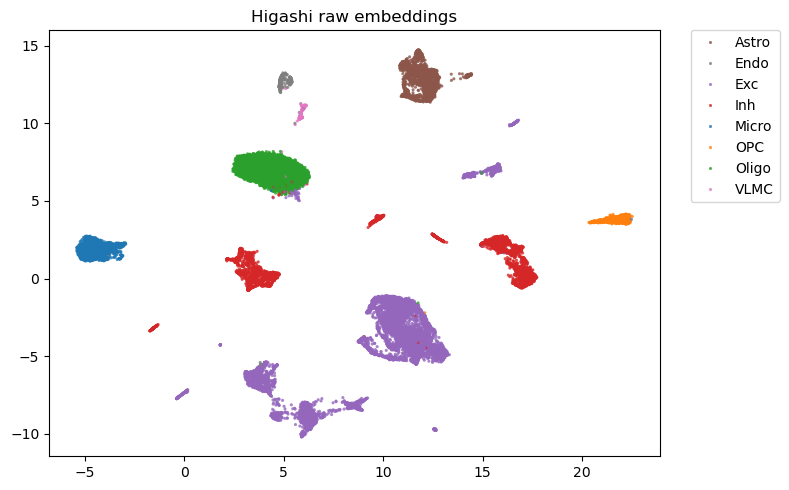

In [60]:
fig = plt.figure(figsize=(8, 5))
cell_type = label_info['major']
ax = sns.scatterplot(x=vec[:, 0], y=vec[:, 1], hue=np.array(cell_type), s=5, alpha=0.8, linewidth=0)
handles, labels = ax.get_legend_handles_labels()
labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1)
ax.title.set_text(f"Higashi raw embeddings")
plt.tight_layout()

# plt.savefig(f'/data/rzhang/GAGE_seq_AD/{data_dir}/{group}/fh_init_embed_{group}.png')
# plt.close('all')
plt.show()

In [61]:
higashi_model.train_for_imputation_nbr_0()
higashi_model.impute_no_nbr()

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

pass_pseudo_id False
pass_pseudo_id False
Second stage training
[ Epoch 0 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5571, mse:  0.0000,  acc: 86.680 %, pearson: 0.636, spearman: 0.535, elapse: 156.606 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4684,  acc: 90.629 %,pearson: 0.708, spearman: 0.597,elapse: 0.141 s

[ Epoch 1 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5108, mse:  0.0000,  acc: 90.062 %, pearson: 0.685, spearman: 0.575, elapse: 74.109 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4519,  acc: 91.416 %,pearson: 0.729, spearman: 0.609,elapse: 0.562 s

[ Epoch 2 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4904, mse:  0.0000,  acc: 91.178 %, pearson: 0.706, spearman: 0.587, elapse: 73.544 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4251,  acc: 92.823 %,pearson: 0.744, spearman: 0.618,elapse: 0.480 s

[ Epoch 3 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4821, mse:  0.0000,  acc: 91.701 %, pearson: 0.713, spearman: 0.592, elapse: 72.851 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4362,  acc: 93.079 %,pearson: 0.755, spearman: 0.621,elapse: 0.166 s

[ Epoch 4 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4723, mse:  0.0000,  acc: 92.256 %, pearson: 0.723, spearman: 0.597, elapse: 66.989 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4304,  acc: 93.090 %,pearson: 0.760, spearman: 0.624,elapse: 0.410 s

[ Epoch 5 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4687, mse:  0.0000,  acc: 92.460 %, pearson: 0.726, spearman: 0.599, elapse: 70.775 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4217,  acc: 93.239 %,pearson: 0.751, spearman: 0.621,elapse: 0.290 s

[ Epoch 6 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4633, mse:  0.0000,  acc: 92.786 %, pearson: 0.731, spearman: 0.602, elapse: 68.571 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4191,  acc: 93.749 %,pearson: 0.773, spearman: 0.629,elapse: 0.450 s

[ Epoch 7 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4588, mse:  0.0000,  acc: 93.047 %, pearson: 0.735, spearman: 0.604, elapse: 77.282 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4122,  acc: 93.757 %,pearson: 0.760, spearman: 0.628,elapse: 0.484 s

[ Epoch 8 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4567, mse:  0.0000,  acc: 93.194 %, pearson: 0.738, spearman: 0.605, elapse: 71.287 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3999,  acc: 94.718 %,pearson: 0.771, spearman: 0.629,elapse: 0.175 s

[ Epoch 9 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4514, mse:  0.0000,  acc: 93.437 %, pearson: 0.741, spearman: 0.607, elapse: 78.986 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4150,  acc: 93.520 %,pearson: 0.774, spearman: 0.631,elapse: 0.898 s

[ Epoch 10 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4527, mse:  0.0000,  acc: 93.416 %, pearson: 0.740, spearman: 0.607, elapse: 74.962 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3728,  acc: 95.484 %,pearson: 0.794, spearman: 0.639,elapse: 0.213 s
no improve: 1	
[ Epoch 11 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4482, mse:  0.0000,  acc: 93.649 %, pearson: 0.744, spearman: 0.609, elapse: 74.564 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3942,  acc: 94.833 %,pearson: 0.781, spearman: 0.635,elapse: 0.365 s

[ Epoch 12 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4470, mse:  0.0000,  acc: 93.715 %, pearson: 0.745, spearman: 0.609, elapse: 75.756 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3670,  acc: 96.072 %,pearson: 0.798, spearman: 0.638,elapse: 0.425 s

[ Epoch 13 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4462, mse:  0.0000,  acc: 93.783 %, pearson: 0.746, spearman: 0.609, elapse: 74.886 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3935,  acc: 94.507 %,pearson: 0.776, spearman: 0.635,elapse: 0.408 s
no improve: 1	
[ Epoch 14 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4420, mse:  0.0000,  acc: 93.929 %, pearson: 0.749, spearman: 0.611, elapse: 76.796 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3956,  acc: 94.907 %,pearson: 0.779, spearman: 0.632,elapse: 0.515 s

[ Epoch 15 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4421, mse:  0.0000,  acc: 93.952 %, pearson: 0.748, spearman: 0.611, elapse: 76.977 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3997,  acc: 94.662 %,pearson: 0.779, spearman: 0.631,elapse: 0.507 s
no improve: 1	
[ Epoch 16 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4405, mse:  0.0000,  acc: 94.062 %, pearson: 0.750, spearman: 0.612, elapse: 73.569 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3646,  acc: 95.850 %,pearson: 0.790, spearman: 0.639,elapse: 0.299 s

[ Epoch 17 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4379, mse:  0.0000,  acc: 94.163 %, pearson: 0.751, spearman: 0.612, elapse: 76.510 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3744,  acc: 95.764 %,pearson: 0.792, spearman: 0.639,elapse: 0.568 s

[ Epoch 18 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4377, mse:  0.0000,  acc: 94.177 %, pearson: 0.751, spearman: 0.612, elapse: 76.376 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3821,  acc: 95.889 %,pearson: 0.781, spearman: 0.635,elapse: 0.157 s
no improve: 1	
[ Epoch 19 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4372, mse:  0.0000,  acc: 94.247 %, pearson: 0.752, spearman: 0.613, elapse: 71.254 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3710,  acc: 96.054 %,pearson: 0.789, spearman: 0.638,elapse: 0.723 s
no improve: 2	
[ Epoch 20 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4370, mse:  0.0000,  acc: 94.216 %, pearson: 0.752, spearman: 0.613, elapse: 76.004 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3713,  acc: 96.100 %,pearson: 0.797, spearman: 0.639,elapse: 0.181 s
no improve: 3	
[ Epoch 21 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4357, mse:  0.0000,  acc: 94.306 %, pearson: 0.753, spearman: 0.613, elapse: 76.514 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3863,  acc: 95.594 %,pearson: 0.783, spearman: 0.635,elapse: 0.356 s

[ Epoch 22 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4352, mse:  0.0000,  acc: 94.333 %, pearson: 0.753, spearman: 0.614, elapse: 76.856 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3721,  acc: 96.100 %,pearson: 0.794, spearman: 0.640,elapse: 0.278 s
no improve: 1	
[ Epoch 23 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4340, mse:  0.0000,  acc: 94.396 %, pearson: 0.754, spearman: 0.614, elapse: 76.716 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3638,  acc: 96.424 %,pearson: 0.794, spearman: 0.638,elapse: 0.296 s

[ Epoch 24 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4348, mse:  0.0000,  acc: 94.382 %, pearson: 0.754, spearman: 0.614, elapse: 74.607 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3707,  acc: 96.108 %,pearson: 0.788, spearman: 0.639,elapse: 0.386 s
no improve: 1	
[ Epoch 25 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4330, mse:  0.0000,  acc: 94.507 %, pearson: 0.756, spearman: 0.615, elapse: 78.457 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3944,  acc: 95.068 %,pearson: 0.781, spearman: 0.635,elapse: 0.324 s
no improve: 2	
[ Epoch 26 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4328, mse:  0.0000,  acc: 94.496 %, pearson: 0.756, spearman: 0.614, elapse: 73.239 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3855,  acc: 95.518 %,pearson: 0.779, spearman: 0.637,elapse: 0.140 s

[ Epoch 27 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4311, mse:  0.0000,  acc: 94.591 %, pearson: 0.757, spearman: 0.615, elapse: 76.926 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3848,  acc: 95.572 %,pearson: 0.803, spearman: 0.639,elapse: 0.661 s

[ Epoch 28 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4315, mse:  0.0000,  acc: 94.574 %, pearson: 0.757, spearman: 0.616, elapse: 76.064 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3726,  acc: 95.850 %,pearson: 0.794, spearman: 0.638,elapse: 0.156 s
no improve: 1	
[ Epoch 29 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4305, mse:  0.0000,  acc: 94.628 %, pearson: 0.757, spearman: 0.616, elapse: 75.528 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3863,  acc: 95.339 %,pearson: 0.780, spearman: 0.634,elapse: 0.332 s
no improve: 2	
[ Epoch 30 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4295, mse:  0.0000,  acc: 94.641 %, pearson: 0.759, spearman: 0.616, elapse: 78.306 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3733,  acc: 96.029 %,pearson: 0.780, spearman: 0.636,elapse: 0.454 s

[ Epoch 31 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4287, mse:  0.0000,  acc: 94.701 %, pearson: 0.759, spearman: 0.616, elapse: 74.519 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3748,  acc: 96.054 %,pearson: 0.800, spearman: 0.640,elapse: 0.594 s
no improve: 1	
[ Epoch 32 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4306, mse:  0.0000,  acc: 94.629 %, pearson: 0.758, spearman: 0.616, elapse: 77.523 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3831,  acc: 95.500 %,pearson: 0.793, spearman: 0.637,elapse: 0.156 s
no improve: 2	
[ Epoch 33 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4278, mse:  0.0000,  acc: 94.713 %, pearson: 0.759, spearman: 0.616, elapse: 78.581 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3738,  acc: 95.911 %,pearson: 0.794, spearman: 0.639,elapse: 0.301 s

[ Epoch 34 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4261, mse:  0.0000,  acc: 94.808 %, pearson: 0.760, spearman: 0.617, elapse: 73.469 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3818,  acc: 96.003 %,pearson: 0.785, spearman: 0.636,elapse: 0.588 s

[ Epoch 35 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4268, mse:  0.0000,  acc: 94.830 %, pearson: 0.761, spearman: 0.617, elapse: 75.881 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3609,  acc: 96.451 %,pearson: 0.800, spearman: 0.641,elapse: 0.246 s
no improve: 1	
[ Epoch 36 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4262, mse:  0.0000,  acc: 94.826 %, pearson: 0.761, spearman: 0.617, elapse: 75.845 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3617,  acc: 96.451 %,pearson: 0.803, spearman: 0.642,elapse: 0.262 s
no improve: 2	
[ Epoch 37 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4266, mse:  0.0000,  acc: 94.832 %, pearson: 0.761, spearman: 0.617, elapse: 76.225 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3727,  acc: 96.180 %,pearson: 0.798, spearman: 0.640,elapse: 0.351 s
no improve: 3	
[ Epoch 38 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4253, mse:  0.0000,  acc: 94.843 %, pearson: 0.760, spearman: 0.617, elapse: 76.341 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3826,  acc: 95.343 %,pearson: 0.794, spearman: 0.636,elapse: 0.438 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

  - (Validation-hyper) bce:  0.3602,  acc: 96.400 %, auc: 0.797, aupr: 0.641,elapse: 40.276 s
/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi
/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py


/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py
/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py
['python', '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py', '/ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_500Kb.JSON', '/ewsc/zhangruo/GAGE_seq_AD//temp_500k/model/model.chkpt_stage2_model', 'test_nbr_0_impute_part_0', 'zinb', '0', '4656', '/ewsc/zhangruo/GAGE_seq_AD//temp_500k/sparse_nondiag_adj_nbr_1.npy', 'None', '7']/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py

/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/

/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py:341: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path, map_location=current_device)
/ewsc/

setting to gpu:2
current_device cuda:2
/ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_500Kb.JSON /ewsc/zhangruo/GAGE_seq_AD//temp_500k/model/model.chkpt_stage2_model test_nbr_0_impute_part_3 zinb 13966 18621
total number of triplets to predict: (825314, 3)
Imputing test_nbr_0_impute_part_3: 1 of 4655, takes 1.21 s estimate 5631.00 s to finish
Imputing test_nbr_0_impute_part_3: 11 of 4655, takes 8.13 s estimate 3431.28 s to finish
Imputing test_nbr_0_impute_part_3: 21 of 4655, takes 15.02 s estimate 3313.98 s to finish
Imputing test_nbr_0_impute_part_3: 31 of 4655, takes 21.90 s estimate 3266.26 s to finish
Imputing test_nbr_0_impute_part_3: 41 of 4655, takes 28.79 s estimate 3239.55 s to finish
Imputing test_nbr_0_impute_part_3: 51 of 4655, takes 35.74 s estimate 3226.10 s to finish
Imputing test_nbr_0_impute_part_3: 61 of 4655, takes 42.62 s estimate 3209.47 s to finish
Imputing test_nbr_0_impute_part_3: 71 of 4655, takes 49.51 s estimate 3196.61 s to finish
Imputing te

  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files


In [62]:
cell_neighbor_list, cell_neighbor_weight_list = higashi_model.get_cell_neighbor_persample(0)

  0%|          | 0/23276 [00:00<?, ?it/s]

In [63]:
cell_neighbor_list = cell_neighbor_list[1:] - 1

In [64]:
cell_neighbor_list

array([array([    0,   887,   470, 11474,  2196,   369]),
       array([    1, 17424, 19438, 10049, 23013,  4516]),
       array([    2, 21125,  3435, 17902, 10291, 18758]), ...,
       array([23273,  4179, 19358, 22271,  9749, 17828]),
       array([23274,  8508, 18149,  3900, 18419, 11702]),
       array([23275,  3931,  7537,  6665,  4320,  7796])], dtype=object)

In [65]:
label = higashi_model.label_info['sub']

In [66]:
arr = label[np.array(list(cell_neighbor_list))]
import numpy as np

# Check if all rows are identical
identical_rows = np.all(arr == arr[:, 0:1], axis=1)

print("All rows are identical:", np.sum(identical_rows), len(identical_rows))

All rows are identical: 22274 23276


In [36]:

higashi_model.train_for_imputation_with_nbr()
higashi_model.impute_with_nbr()



  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

getting cell nbr's nbr list
within sample mode - get nbr


  0%|          | 0/23276 [00:00<?, ?it/s]

[list([]) array([    1,   888,   471, 11475,  2197,   370])
 array([    2, 17425, 19439, 10050, 23014,  4517])
 array([    3, 21126,  3436, 17903, 10292, 18759])
 array([    4, 22769, 16022, 13126,  8982, 18279])
 array([    5, 12404, 11464,  8560,  3755, 13304])
 array([   6, 1811, 1269,  242, 8799, 1393])
 array([    7,  8202,  9275, 10061, 15305,  3587])
 array([   8,  165,  826, 2770, 3461, 4054])
 array([    9, 20696, 20697,  2576, 22389, 19679])] [list([])
 array([0.39597469, 0.15340952, 0.13449374, 0.10783657, 0.10459446,
        0.10369102])
 array([0.39892015, 0.12515408, 0.12476758, 0.11770277, 0.11748731,
        0.11596812])
 array([0.39896078, 0.12501871, 0.12269388, 0.11952214, 0.11739846,
        0.11640602])
 array([0.39751858, 0.1487055 , 0.11691138, 0.11467277, 0.11184495,
        0.1103468 ])
 array([0.39899349, 0.12419313, 0.12191273, 0.11953224, 0.11811575,
        0.11725265])
 array([0.39855526, 0.13099908, 0.12560885, 0.12161323, 0.11223587,
        0.11098772])

  0%|          | 0/23277 [00:00<?, ?it/s]

Final stage training
[ Epoch 0 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5304, mse:  0.0000,  acc: 88.136 %, pearson: 0.681, spearman: 0.557, elapse: 169.684 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4968,  acc: 88.451 %,pearson: 0.728, spearman: 0.590,elapse: 0.402 s

[ Epoch 1 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5252, mse:  0.0000,  acc: 88.537 %, pearson: 0.687, spearman: 0.560, elapse: 99.382 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4711,  acc: 89.272 %,pearson: 0.727, spearman: 0.596,elapse: 0.895 s

[ Epoch 2 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5238, mse:  0.0000,  acc: 88.644 %, pearson: 0.687, spearman: 0.561, elapse: 91.952 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4823,  acc: 88.578 %,pearson: 0.715, spearman: 0.591,elapse: 0.222 s

[ Epoch 3 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5235, mse:  0.0000,  acc: 88.675 %, pearson: 0.687, spearman: 0.561, elapse: 95.029 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4828,  acc: 88.772 %,pearson: 0.723, spearman: 0.591,elapse: 0.239 s
no improve: 1	
[ Epoch 4 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5213, mse:  0.0000,  acc: 88.752 %, pearson: 0.690, spearman: 0.562, elapse: 96.825 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4885,  acc: 87.815 %,pearson: 0.724, spearman: 0.595,elapse: 0.990 s

[ Epoch 5 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5201, mse:  0.0000,  acc: 88.798 %, pearson: 0.690, spearman: 0.562, elapse: 97.251 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4861,  acc: 88.109 %,pearson: 0.737, spearman: 0.595,elapse: 0.896 s

[ Epoch 6 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5223, mse:  0.0000,  acc: 88.708 %, pearson: 0.690, spearman: 0.561, elapse: 96.887 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4775,  acc: 88.941 %,pearson: 0.721, spearman: 0.592,elapse: 0.641 s
no improve: 1	
[ Epoch 7 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5203, mse:  0.0000,  acc: 88.693 %, pearson: 0.690, spearman: 0.561, elapse: 94.044 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4989,  acc: 87.320 %,pearson: 0.720, spearman: 0.586,elapse: 0.557 s
no improve: 2	
[ Epoch 8 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5197, mse:  0.0000,  acc: 88.703 %, pearson: 0.692, spearman: 0.563, elapse: 96.732 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4949,  acc: 88.160 %,pearson: 0.725, spearman: 0.584,elapse: 0.448 s
no improve: 3	
[ Epoch 9 of 30 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.5191, mse:  0.0000,  acc: 88.644 %, pearson: 0.692, spearman: 0.562, elapse: 97.683 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.5044,  acc: 87.652 %,pearson: 0.724, spearman: 0.585,elapse: 0.375 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

  - (Validation-hyper) bce:  0.4799,  acc: 87.845 %, auc: 0.732, aupr: 0.595,elapse: 109.587 s
select gpus [6 4 3 2 1]
/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi
/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py




['python', '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py', '/ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_500Kb.JSON', '/ewsc/zhangruo/GAGE_seq_AD//temp_500k/model/model.chkpt_stage3_model', 'test_nbr_5_impute_part_4', 'zinb', '18621', '23276', '/ewsc/zhangruo/GAGE_seq_AD//temp_500k/sparse_nondiag_adj_nbr_1.npy', '/ewsc/zhangruo/GAGE_seq_AD//temp_500k/weighted_info.npy', '1']/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py/ewsc/zhangruo/GAGE_seq_AD

/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py:341: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path, map_location=current_device)
/ewsc/

setting to gpu:2
current_device cuda:2
/ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_500Kb.JSON /ewsc/zhangruo/GAGE_seq_AD//temp_500k/model/model.chkpt_stage3_model test_nbr_5_impute_part_3 zinb 13966 18621
total number of triplets to predict: (825314, 3)
Imputing test_nbr_5_impute_part_3: 1 of 4655, takes 0.99 s estimate 4604.08 s to finish
Imputing test_nbr_5_impute_part_3: 11 of 4655, takes 8.09 s estimate 3413.56 s to finish
Imputing test_nbr_5_impute_part_3: 21 of 4655, takes 15.32 s estimate 3380.23 s to finish
Imputing test_nbr_5_impute_part_3: 31 of 4655, takes 22.35 s estimate 3333.26 s to finish
Imputing test_nbr_5_impute_part_3: 41 of 4655, takes 29.42 s estimate 3310.89 s to finish
Imputing test_nbr_5_impute_part_3: 51 of 4655, takes 36.48 s estimate 3293.65 s to finish
Imputing test_nbr_5_impute_part_3: 61 of 4655, takes 43.59 s estimate 3282.97 s to finish
Imputing test_nbr_5_impute_part_3: 71 of 4655, takes 50.69 s estimate 3272.85 s to finish
Imputing te

  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files
start removing temp files


(397, 397)
(397, 397)
(397, 397)
(397, 397)
(397, 397)


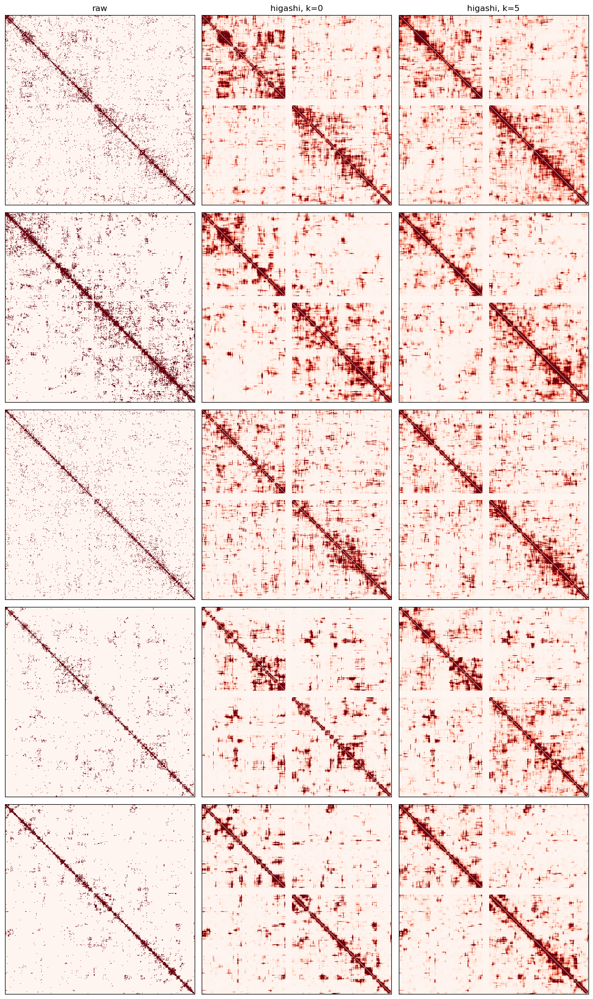

In [37]:
import matplotlib.pyplot as plt
count = 0
fig = plt.figure(figsize=(12, 4*5))
for id_ in np.random.randint(0, len(higashi_embedding), 5):
    # code to fetch imputed contact maps
    ori, nbr0, nbr5 = higashi_model.fetch_map("chr3", id_)
    print(ori.shape)
    count += 1
    ax = plt.subplot(5, 3, count * 3 - 2)
    ax.imshow(ori.toarray(), cmap='Reds', vmin=0.0, vmax=1)
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("raw")
    
    ax = plt.subplot(5, 3, count * 3 - 1)
    ax.imshow(nbr0.toarray(), cmap='Reds', vmin=0.0, vmax=np.quantile(nbr0.data, 0.95))
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("higashi, k=0")
    
    ax = plt.subplot(5, 3, count * 3)
    ax.imshow(nbr5.toarray(), cmap='Reds', vmin=0.0, vmax=np.quantile(nbr5.data, 0.95))
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("higashi, k=5")
    
plt.tight_layout()
# plt.savefig(f'/data/rzhang/GAGE_seq_AD/{data_dir}/{group}/impute_contactmaps_{group}.png')
# plt.close('all')

In [38]:

command = ['python', 
           '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scCompartment.py',
           '-c',
           f'{data_dir}/config_dir/config_gage_ad_higashi_500Kb.JSON',
           '--calib_file',
           '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/CpG_hg38_500k.txt',
           '--calib', '--neighbor', '-o', 'scAB_500kb_nbr5']
import subprocess
subprocess.run(command)

command = ['python', 
           '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scCompartment.py',
           '-c',
           f'{data_dir}/config_dir/config_gage_ad_higashi_500Kb.JSON',
           '--calib_file',
           '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/CpG_hg38_500k.txt',
           '--calib', '-o', 'scAB_500kb_nbr0']
import subprocess
subprocess.run(command)

Namespace(config='/ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_500Kb.JSON', neighbor=True, output='scAB_500kb_nbr5', calib_file='/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/CpG_hg38_500k.txt', calib=True)
(498, 498)
average cpg 0.005839040000000001 0.01759744
average cpg 0.01423690909090909 0.0066370000000000005


100%|██████████| 23276/23276 [07:47<00:00, 49.74it/s]


chr1 finished
(485, 485)
average cpg 0.006381368421052632 0.012636631578947366
average cpg 0.015638033333333332 0.005689533333333332


IOPub message rate exceeded.[03:23<06:37, 38.59it/s]
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [39]:
print()

## Now start Higashi - 100kb

In [5]:

config = f'{data_dir}/config_dir/config_gage_ad_higashi_100Kb.JSON'
config_info = {
    "data_dir": f"{data_dir}",
    "structured": True,
    "header_included": False,
    "contact_header": ["chrom1", "pos1", "chrom2", "pos2"],
    "input_format": 'higashi_v2',
    "temp_dir": f"{data_dir}/temp_100k",
    "genome_reference_path": "/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/hg38.chrom.sizes.txt",
    "cytoband_path": "/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/cytoBand_hg38.txt",
    "chrom_list": ["chr1", "chr2","chr3","chr4","chr5",
                   "chr6","chr7","chr8","chr9","chr10",
                   "chr11","chr12","chr13","chr14","chr15",
                   "chr16","chr17","chr18","chr19","chr20",
                   "chr21","chr22"],
    "resolution": 100000,
    "resolution_cell": 100000,
    "embedding_name": "test",
    "minimum_distance": 100000,
    "maximum_distance": -1,
    "local_transfer_range": 0,
    "loss_mode": "zinb",
    "dimensions": 256,
    "impute_list":["chr1", "chr2","chr3","chr4","chr5",
                   "chr6","chr7","chr8","chr9","chr10",
                   "chr11","chr12","chr13","chr14","chr15",
                   "chr16","chr17","chr18","chr19","chr20",
                   "chr21","chr22"],
    "neighbor_num": 5,
    "cpu_num": 32,
    "gpu_num": 8,
    "embedding_epoch":60,
    "correct_be_impute": False,
    "persample_id":"disease_group",
    "within_sample_nbr": True,
    "pre_cell_embed": f'{data_dir}/rna_cell_embedding.npy'
}
import json
with open(config,"w") as f:
    json.dump(config_info, f, indent = 6)
from higashi.Higashi_wrapper import *
from fasthigashi.FastHigashi_Wrapper import *
higashi_model = Higashi(config)
# higashi_model.process_data()

In [6]:
config = f'{data_dir}/config_dir/config_gage_ad_higashi_100Kb.JSON'

from higashi.Higashi_wrapper import *
from fasthigashi.FastHigashi_Wrapper import *
higashi_model = Higashi(config)
higashi_model.prep_model()

cpu_num 32
setting to gpu:2
training on data from: ['chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19', 'chr20', 'chr21', 'chr22']
total_sparsity_cell 0.11434834028401561
contractive loss
batch_size 1280
Node type num [23276  2490  2422  1983  1903  1816  1709  1594  1452  1384  1338  1351
  1333  1144  1071  1020   904   833   804   587   645   468   509] [23276 25766 28188 30171 32074 33890 35599 37193 38645 40029 41367 42718
 44051 45195 46266 47286 48190 49023 49827 50414 51059 51527 52036]
pre_cell_embed
start making attribute


  0%|          | 0/300 [00:00<?, ?it/s]

loss 0.04700329527258873 loss best 0.045148685574531555 epochs 299

initializing data generator


  0%|          | 0/22 [00:00<?, ?it/s]

initializing data generator


  0%|          | 0/22 [00:00<?, ?it/s]

In [7]:


# # Stage 1 training
# higashi_model.train_for_embeddings()

# # fetch trained embeddings
higashi_embedding = higashi_model.fetch_cell_embeddings()

Loading from last training results


In [8]:
with open(os.path.join(higashi_model.data_dir, "label_info.pickle"), "rb") as f:
    label_info = pickle.load(f)
# # fetch trained embeddings
higashi_embedding = higashi_model.fetch_cell_embeddings()
from umap import UMAP
import seaborn as sns
import matplotlib.pyplot as plt
vec = UMAP(n_components=2, n_neighbors=15, random_state=0).fit_transform(higashi_embedding)

2025-04-14 11:50:37.196780: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-14 11:50:37.196890: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-14 11:50:37.300241: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-14 11:50:37.336609: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


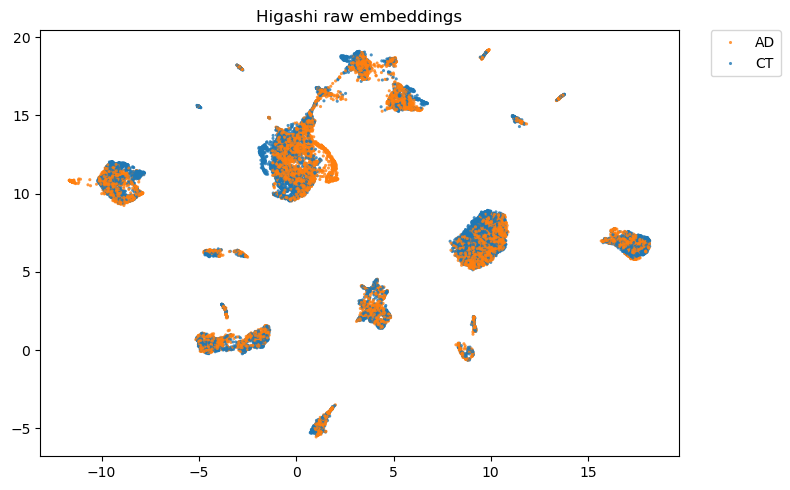

In [9]:
fig = plt.figure(figsize=(8, 5))
cell_type = label_info['disease_group']
ax = sns.scatterplot(x=vec[:, 0], y=vec[:, 1], hue=np.array(cell_type), s=5, alpha=0.8, linewidth=0)
handles, labels = ax.get_legend_handles_labels()
labels, handles = zip(*sorted(zip(labels, handles), key=lambda t: t[0]))
ax.legend(handles=handles, labels=labels, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., ncol=1)
ax.title.set_text(f"Higashi raw embeddings")
plt.tight_layout()

# plt.savefig(f'/data/rzhang/GAGE_seq_AD/{data_dir}/{group}/fh_init_embed_{group}.png')
# plt.close('all')
plt.show()

In [10]:
higashi_model.train_for_imputation_nbr_0()

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

pass_pseudo_id False
pass_pseudo_id False
Second stage training
[ Epoch 0 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4731, mse:  0.0000,  acc: 87.008 %, pearson: 0.573, spearman: 0.538, elapse: 150.425 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.4031,  acc: 91.306 %,pearson: 0.670, spearman: 0.592,elapse: 0.251 s

[ Epoch 1 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4405, mse:  0.0000,  acc: 89.345 %, pearson: 0.628, spearman: 0.566, elapse: 80.610 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3862,  acc: 91.611 %,pearson: 0.698, spearman: 0.607,elapse: 0.388 s

[ Epoch 2 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4266, mse:  0.0000,  acc: 90.275 %, pearson: 0.648, spearman: 0.576, elapse: 77.026 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3668,  acc: 92.848 %,pearson: 0.717, spearman: 0.613,elapse: 0.809 s

[ Epoch 3 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4188, mse:  0.0000,  acc: 90.791 %, pearson: 0.660, spearman: 0.581, elapse: 80.691 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3864,  acc: 91.592 %,pearson: 0.706, spearman: 0.612,elapse: 0.722 s

[ Epoch 4 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4136, mse:  0.0000,  acc: 91.162 %, pearson: 0.669, spearman: 0.584, elapse: 84.752 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3675,  acc: 92.646 %,pearson: 0.728, spearman: 0.615,elapse: 0.601 s

[ Epoch 5 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4094, mse:  0.0000,  acc: 91.414 %, pearson: 0.675, spearman: 0.587, elapse: 80.171 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3833,  acc: 91.516 %,pearson: 0.727, spearman: 0.616,elapse: 0.289 s

[ Epoch 6 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4073, mse:  0.0000,  acc: 91.576 %, pearson: 0.679, spearman: 0.588, elapse: 77.993 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3551,  acc: 93.552 %,pearson: 0.741, spearman: 0.621,elapse: 0.417 s

[ Epoch 7 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4042, mse:  0.0000,  acc: 91.768 %, pearson: 0.683, spearman: 0.590, elapse: 80.313 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3515,  acc: 93.609 %,pearson: 0.747, spearman: 0.623,elapse: 0.491 s

[ Epoch 8 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4009, mse:  0.0000,  acc: 91.954 %, pearson: 0.688, spearman: 0.592, elapse: 77.278 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3650,  acc: 92.784 %,pearson: 0.734, spearman: 0.621,elapse: 0.732 s

[ Epoch 9 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.4000, mse:  0.0000,  acc: 92.017 %, pearson: 0.689, spearman: 0.593, elapse: 80.484 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3563,  acc: 93.135 %,pearson: 0.747, spearman: 0.621,elapse: 0.662 s
no improve: 1	
[ Epoch 10 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3972, mse:  0.0000,  acc: 92.167 %, pearson: 0.693, spearman: 0.594, elapse: 78.105 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3319,  acc: 94.741 %,pearson: 0.765, spearman: 0.629,elapse: 0.139 s

[ Epoch 11 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3970, mse:  0.0000,  acc: 92.216 %, pearson: 0.695, spearman: 0.594, elapse: 74.796 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3510,  acc: 93.784 %,pearson: 0.748, spearman: 0.621,elapse: 0.151 s
no improve: 1	
[ Epoch 12 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3955, mse:  0.0000,  acc: 92.296 %, pearson: 0.697, spearman: 0.595, elapse: 73.723 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3295,  acc: 95.115 %,pearson: 0.770, spearman: 0.630,elapse: 0.129 s

[ Epoch 13 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3917, mse:  0.0000,  acc: 92.468 %, pearson: 0.700, spearman: 0.597, elapse: 76.073 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3397,  acc: 94.281 %,pearson: 0.762, spearman: 0.628,elapse: 0.142 s

[ Epoch 14 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3927, mse:  0.0000,  acc: 92.467 %, pearson: 0.701, spearman: 0.597, elapse: 74.504 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3263,  acc: 95.301 %,pearson: 0.769, spearman: 0.630,elapse: 0.143 s
no improve: 1	
[ Epoch 15 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3910, mse:  0.0000,  acc: 92.532 %, pearson: 0.702, spearman: 0.598, elapse: 76.778 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3396,  acc: 94.210 %,pearson: 0.769, spearman: 0.630,elapse: 0.142 s
no improve: 2	
[ Epoch 16 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3905, mse:  0.0000,  acc: 92.586 %, pearson: 0.704, spearman: 0.598, elapse: 76.064 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3363,  acc: 95.001 %,pearson: 0.766, spearman: 0.629,elapse: 0.139 s

[ Epoch 17 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3875, mse:  0.0000,  acc: 92.711 %, pearson: 0.706, spearman: 0.599, elapse: 75.900 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3306,  acc: 95.108 %,pearson: 0.773, spearman: 0.630,elapse: 0.149 s

[ Epoch 18 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3882, mse:  0.0000,  acc: 92.707 %, pearson: 0.707, spearman: 0.599, elapse: 77.434 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3259,  acc: 95.215 %,pearson: 0.778, spearman: 0.632,elapse: 0.140 s
no improve: 1	
[ Epoch 19 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3874, mse:  0.0000,  acc: 92.753 %, pearson: 0.707, spearman: 0.600, elapse: 79.310 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3232,  acc: 95.409 %,pearson: 0.775, spearman: 0.632,elapse: 0.143 s
no improve: 2	
[ Epoch 20 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3861, mse:  0.0000,  acc: 92.828 %, pearson: 0.709, spearman: 0.600, elapse: 75.921 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3292,  acc: 95.245 %,pearson: 0.769, spearman: 0.630,elapse: 0.142 s

[ Epoch 21 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3860, mse:  0.0000,  acc: 92.865 %, pearson: 0.710, spearman: 0.601, elapse: 74.228 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3343,  acc: 94.410 %,pearson: 0.776, spearman: 0.631,elapse: 0.139 s
no improve: 1	
[ Epoch 22 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3850, mse:  0.0000,  acc: 92.897 %, pearson: 0.711, spearman: 0.601, elapse: 76.842 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3274,  acc: 95.017 %,pearson: 0.775, spearman: 0.631,elapse: 0.141 s

[ Epoch 23 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3836, mse:  0.0000,  acc: 92.950 %, pearson: 0.712, spearman: 0.601, elapse: 75.668 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3310,  acc: 95.229 %,pearson: 0.776, spearman: 0.630,elapse: 0.141 s

[ Epoch 24 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3837, mse:  0.0000,  acc: 92.993 %, pearson: 0.713, spearman: 0.602, elapse: 75.466 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3291,  acc: 95.292 %,pearson: 0.782, spearman: 0.631,elapse: 0.143 s
no improve: 1	
[ Epoch 25 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3830, mse:  0.0000,  acc: 93.019 %, pearson: 0.714, spearman: 0.602, elapse: 74.549 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3198,  acc: 95.729 %,pearson: 0.786, spearman: 0.633,elapse: 0.141 s
no improve: 2	
[ Epoch 26 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3810, mse:  0.0000,  acc: 93.102 %, pearson: 0.716, spearman: 0.603, elapse: 74.085 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3135,  acc: 95.651 %,pearson: 0.795, spearman: 0.634,elapse: 0.177 s

[ Epoch 27 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3812, mse:  0.0000,  acc: 93.106 %, pearson: 0.716, spearman: 0.603, elapse: 79.158 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3299,  acc: 95.036 %,pearson: 0.780, spearman: 0.633,elapse: 0.190 s
no improve: 1	
[ Epoch 28 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3803, mse:  0.0000,  acc: 93.144 %, pearson: 0.717, spearman: 0.603, elapse: 75.781 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3277,  acc: 94.999 %,pearson: 0.777, spearman: 0.632,elapse: 0.142 s
no improve: 2	
[ Epoch 29 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3792, mse:  0.0000,  acc: 93.186 %, pearson: 0.718, spearman: 0.604, elapse: 75.475 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3307,  acc: 94.737 %,pearson: 0.786, spearman: 0.632,elapse: 0.146 s

[ Epoch 30 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3775, mse:  0.0000,  acc: 93.244 %, pearson: 0.720, spearman: 0.604, elapse: 75.200 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3122,  acc: 95.803 %,pearson: 0.795, spearman: 0.635,elapse: 0.136 s

[ Epoch 31 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3801, mse:  0.0000,  acc: 93.180 %, pearson: 0.718, spearman: 0.603, elapse: 78.000 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3270,  acc: 95.272 %,pearson: 0.777, spearman: 0.630,elapse: 0.146 s
no improve: 1	
[ Epoch 32 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3770, mse:  0.0000,  acc: 93.306 %, pearson: 0.721, spearman: 0.605, elapse: 75.811 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3172,  acc: 95.417 %,pearson: 0.792, spearman: 0.634,elapse: 0.141 s
no improve: 2	
[ Epoch 33 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3779, mse:  0.0000,  acc: 93.272 %, pearson: 0.721, spearman: 0.604, elapse: 76.206 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3211,  acc: 95.249 %,pearson: 0.787, spearman: 0.633,elapse: 0.145 s
no improve: 3	
[ Epoch 34 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3750, mse:  0.0000,  acc: 93.380 %, pearson: 0.723, spearman: 0.605, elapse: 78.152 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3183,  acc: 95.374 %,pearson: 0.789, spearman: 0.633,elapse: 0.150 s

[ Epoch 35 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3754, mse:  0.0000,  acc: 93.378 %, pearson: 0.722, spearman: 0.605, elapse: 76.390 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3159,  acc: 95.467 %,pearson: 0.799, spearman: 0.636,elapse: 0.139 s
no improve: 1	
[ Epoch 36 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3752, mse:  0.0000,  acc: 93.394 %, pearson: 0.723, spearman: 0.605, elapse: 77.156 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3274,  acc: 94.904 %,pearson: 0.783, spearman: 0.632,elapse: 0.145 s
no improve: 2	
[ Epoch 37 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3759, mse:  0.0000,  acc: 93.396 %, pearson: 0.723, spearman: 0.605, elapse: 75.587 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3046,  acc: 96.022 %,pearson: 0.806, spearman: 0.637,elapse: 0.139 s
no improve: 3	
[ Epoch 38 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3738, mse:  0.0000,  acc: 93.475 %, pearson: 0.725, spearman: 0.606, elapse: 74.912 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3266,  acc: 94.983 %,pearson: 0.783, spearman: 0.632,elapse: 0.203 s

[ Epoch 39 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3722, mse:  0.0000,  acc: 93.533 %, pearson: 0.727, spearman: 0.607, elapse: 74.823 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3216,  acc: 95.182 %,pearson: 0.791, spearman: 0.633,elapse: 0.146 s

[ Epoch 40 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3725, mse:  0.0000,  acc: 93.575 %, pearson: 0.727, spearman: 0.607, elapse: 76.099 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3289,  acc: 94.809 %,pearson: 0.785, spearman: 0.633,elapse: 0.143 s
no improve: 1	
[ Epoch 41 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3718, mse:  0.0000,  acc: 93.601 %, pearson: 0.728, spearman: 0.607, elapse: 76.379 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3048,  acc: 96.146 %,pearson: 0.802, spearman: 0.636,elapse: 0.137 s
no improve: 2	
[ Epoch 42 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3699, mse:  0.0000,  acc: 93.683 %, pearson: 0.730, spearman: 0.608, elapse: 78.949 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3183,  acc: 95.357 %,pearson: 0.795, spearman: 0.636,elapse: 0.141 s

[ Epoch 43 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3698, mse:  0.0000,  acc: 93.681 %, pearson: 0.731, spearman: 0.608, elapse: 76.472 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.3210,  acc: 95.260 %,pearson: 0.791, spearman: 0.633,elapse: 0.146 s
no improve: 1	
[ Epoch 44 of 45 ]


 - (Training) :   0%|          | 0/1000 [00:00<?, ?it/s]

- (Train)   bce:  0.3687, mse:  0.0000,  acc: 93.739 %, pearson: 0.732, spearman: 0.608, elapse: 76.543 s


  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

- (Valid) bce:  0.2999,  acc: 96.190 %,pearson: 0.808, spearman: 0.637,elapse: 0.143 s



  - (Validation)   :   0%|          | 0/10 [00:00<?, ?it/s]

  - (Validation-hyper) bce:  0.3108,  acc: 95.888 %, auc: 0.801, aupr: 0.636,elapse: 36.057 s


In [11]:
higashi_model.impute_no_nbr()

/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi






/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py






['python', '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py', '/ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_100Kb.JSON', '/ewsc/zhangruo/GAGE_seq_AD//temp_100k/model/model

/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/Impute.py:341: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(path, map_location=current_device)
/ewsc/

setting to gpu:7
current_device cuda:7
/ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_100Kb.JSON /ewsc/zhangruo/GAGE_seq_AD//temp_100k/model/model.chkpt_stage2_model test_nbr_0_impute_part_0 zinb 0 3326
total number of triplets to predict: (20748267, 3)
Imputing test_nbr_0_impute_part_0: 1 of 3326, takes 16.31 s estimate 54227.89 s to finish
Imputing test_nbr_0_impute_part_0: 11 of 3326, takes 180.85 s estimate 54500.25 s to finish
Imputing test_nbr_0_impute_part_0: 21 of 3326, takes 345.26 s estimate 54337.80 s to finish
Imputing test_nbr_0_impute_part_0: 31 of 3326, takes 510.05 s estimate 54213.36 s to finish
Imputing test_nbr_0_impute_part_0: 41 of 3326, takes 674.00 s estimate 54002.17 s to finish
Imputing test_nbr_0_impute_part_0: 51 of 3326, takes 838.38 s estimate 53837.27 s to finish
Imputing test_nbr_0_impute_part_0: 61 of 3326, takes 1002.34 s estimate 53649.97 s to finish
Imputing test_nbr_0_impute_part_0: 71 of 3326, takes 1166.64 s estimate 53484.68 s to fi

  0%|          | 0/23276 [00:00<?, ?it/s]

start removing temp files


  0%|          | 0/23276 [00:00<?, ?it/s]

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [ ]:

higashi_model.train_for_imputation_with_nbr()
higashi_model.impute_with_nbr()



(1983, 1983)
(1983, 1983)
(1983, 1983)
(1983, 1983)
(1983, 1983)


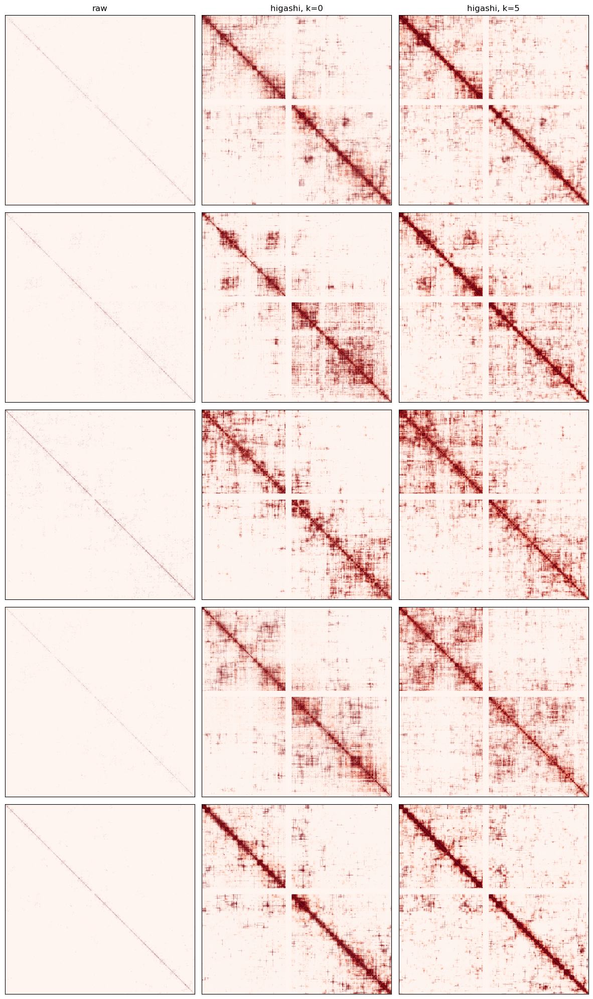

In [13]:
import matplotlib.pyplot as plt
count = 0
fig = plt.figure(figsize=(12, 4*5))
for id_ in np.random.randint(0, len(higashi_embedding), 5):
    # code to fetch imputed contact maps
    ori, nbr0, nbr5 = higashi_model.fetch_map("chr3", id_)
    print(ori.shape)
    count += 1
    ax = plt.subplot(5, 3, count * 3 - 2)
    ax.imshow(ori.toarray(), cmap='Reds', vmin=0.0, vmax=1)
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("raw")
    
    ax = plt.subplot(5, 3, count * 3 - 1)
    ax.imshow(nbr0.toarray(), cmap='Reds', vmin=0.0, vmax=np.quantile(nbr0.data, 0.95))
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("higashi, k=0")
    
    ax = plt.subplot(5, 3, count * 3)
    ax.imshow(nbr5.toarray(), cmap='Reds', vmin=0.0, vmax=np.quantile(nbr5.data, 0.95))
    ax.set_xticks([], [])
    ax.set_yticks([], [])
    if count == 1:
        ax.set_title("higashi, k=5")
    
plt.tight_layout()
# plt.savefig(f'/data/rzhang/GAGE_seq_AD/{data_dir}/{group}/impute_contactmaps_{group}.png')
# plt.close('all')

In [11]:
import subprocess

command = ['python', 
           '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scCompartment.py',
           '-c',
           f'{data_dir}/config_dir/config_gage_ad_higashi_100Kb.JSON',
           '--calib_file',
           '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/CpG_hg38_100k.txt',
           '--calib', '--neighbor', '-o', 'scAB_100kb_nbr5']

# subprocess.run(command)
print (" ".join(command))
command = ['python', '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scTAD.py', 
           '-c', f'{data_dir}/config_dir/config_gage_ad_higashi_100Kb.JSON', 
           '--neighbor', '-o', 'scTAD_nbr5']
# subprocess.run(command)
print (" ".join(command))

python /ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scCompartment.py -c /ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_100Kb.JSON --calib_file /ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/CpG_hg38_100k.txt --calib --neighbor -o scAB_100kb_nbr5
python /ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scTAD.py -c /ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_100Kb.JSON --neighbor -o scTAD_nbr5


In [12]:

import subprocess
command = ['python', 
           '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scCompartment.py',
           '-c',
           f'{data_dir}/config_dir/config_gage_ad_higashi_100Kb.JSON',
           '--calib_file',
           '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/CpG_hg38_100k.txt',
           '--calib', '-o', 'scAB_100kb_nbr0']
# subprocess.run(command)
print (" ".join(command))
command = ['python', '/ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scTAD.py', 
           '-c', f'{data_dir}/config_dir/config_gage_ad_higashi_100Kb.JSON', 
           '-o', 'scTAD_nbr0']
# subprocess.run(command)
print (" ".join(command))
import subprocess




python /ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scCompartment.py -c /ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_100Kb.JSON --calib_file /ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/CpG_hg38_100k.txt --calib -o scAB_100kb_nbr0
python /ewsc/zhangruo/GAGE_seq_AD_notebook/Higashi/higashi/scTAD.py -c /ewsc/zhangruo/GAGE_seq_AD//config_dir/config_gage_ad_higashi_100Kb.JSON -o scTAD_nbr0


In [78]:
print()

## Organize scAB and scTAD results

In [15]:
import h5py
import numpy as np
import anndata
adata_final = None
os.makedirs(f'{data_dir}/transfer', exist_ok=True)
label_info = pickle.load(open(f"{data_dir}/label_info.pickle", "rb"))
meta = pd.DataFrame(label_info)
meta.index = label_info['cell_name_higashi']

In [40]:

for res in ['100k']:
    for nbr in [0, 5]:
        for key in ['compartment', 'compartment_raw', 'compartment_zscore']:
            genome_scAB = []
            with h5py.File(f"{data_dir}/temp_{res}/scAB_{res}b_nbr{nbr}.hdf5", "r") as cp_f:
                print(cp_f.keys())
                cp = cp_f[key]
                print (cp['bin'].keys())
                for id_ in trange(len(meta)):
                    v = np.array(cp['cell_%d' % id_])
                    genome_scAB.append(v)
                
                genome_scAB = np.stack(genome_scAB, axis=0)
                adata = anndata.AnnData(X = genome_scAB)
                chroms = cp['bin']['chrom'][:]
                chroms = [xx.decode('utf-8') for xx in chroms]
                adata.var['chrom'] = chroms
                adata.var['start'] = cp['bin']['start']
                adata.var['end'] = cp['bin']['end']
                adata.obs = meta
                adata.write(f"{data_dir}/transfer/scAB_{res}_nbr{nbr}_{key}.h5ad")

<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

In [16]:
for nbr in [0, 5]: 
    for key in ['calib_tads', 'insulation', 'tads']:
        genome_scTAD = []
        with h5py.File(f"{data_dir}/temp_100k/scTAD_nbr{nbr}.hdf5", "r") as cp_f:
            print(cp_f.keys())
            cp = cp_f[key]
            print (cp['bin'].keys())
            for id_ in trange(len(meta)):
                v = np.array(cp['cell_%d' % id_])
                genome_scTAD.append(v)
            
            genome_scTAD = np.stack(genome_scTAD, axis=0)
            adata = anndata.AnnData(X = genome_scTAD)
            chroms = cp['bin']['chrom'][:]
            chroms = [xx.decode('utf-8') for xx in chroms]
            adata.var['chrom'] = chroms
            adata.var['start'] = cp['bin']['start']
            adata.var['end'] = cp['bin']['end']
            adata.obs = meta
            adata.write(f"{data_dir}/transfer/scTAD_100k_nbr{nbr}_{key}.h5ad")

<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


  0%|          | 0/23276 [00:00<?, ?it/s]

In [19]:

# fetch calculated scAB values
import h5py
import numpy as np
import anndata
adata_final = None
os.makedirs(f'{data_dir}/transfer', exist_ok=True)
label_info = pickle.load(open(f"{data_dir}/label_info.pickle", "rb"))
meta = pd.DataFrame(label_info)
meta.index = label_info['cell_name_higashi']
for res in ['100k', '500k']:
    for nbr in [0, 5]:
        for key in ['compartment', 'compartment_raw', 'compartment_zscore']:
            genome_scAB = []
            with h5py.File(f"{data_dir}/temp_{res}/scAB_{res}b_nbr{nbr}.hdf5", "r") as cp_f:
                print(cp_f.keys())
                cp = cp_f[key]
                print (cp['bin'].keys())
                for id_ in trange(len(meta)):
                    v = np.array(cp['cell_%d' % id_])
                    genome_scAB.append(v)
                
                genome_scAB = np.stack(genome_scAB, axis=0)
                adata = anndata.AnnData(X = genome_scAB)
                chroms = cp['bin']['chrom'][:]
                chroms = [xx.decode('utf-8') for xx in chroms]
                adata.var['chrom'] = chroms
                adata.var['start'] = cp['bin']['start']
                adata.var['end'] = cp['bin']['end']
                adata.obs = meta
                adata.write(f"{data_dir}/transfer/scAB_{res}_nbr{nbr}_{key}.h5ad")
for nbr in [0, 5]: 
    for key in ['calib_tads', 'insulation', 'tads']:
        genome_scTAD = []
        with h5py.File(f"{data_dir}/temp_100k/scTAD_nbr{nbr}.hdf5", "r") as cp_f:
            print(cp_f.keys())
            cp = cp_f[key]
            print (cp['bin'].keys())
            for id_ in trange(len(meta)):
                v = np.array(cp['cell_%d' % id_])
                genome_scTAD.append(v)
            
            genome_scTAD = np.stack(genome_scTAD, axis=0)
            adata = anndata.AnnData(X = genome_scTAD)
            chroms = cp['bin']['chrom'][:]
            chroms = [xx.decode('utf-8') for xx in chroms]
            adata.var['chrom'] = chroms
            adata.var['start'] = cp['bin']['start']
            adata.var['end'] = cp['bin']['end']
            adata.obs = meta
            adata.write(f"{data_dir}/transfer/scTAD_100k_nbr{nbr}_{key}.h5ad")

<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [00:50<00:00, 476.06it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [00:53<00:00, 448.53it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [01:10<00:00, 336.53it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:23<00:00, 1032.96it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:20<00:00, 1185.63it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:20<00:00, 1138.98it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:23<00:00, 1014.55it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:22<00:00, 1045.13it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:21<00:00, 1097.55it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:07<00:00, 3378.44it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:17<00:00, 1389.88it/s]


<KeysViewHDF5 ['compartment', 'compartment_raw', 'compartment_zscore']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|█████████████████████████████████████████████████████████████████████| 23825/23825 [00:12<00:00, 1900.21it/s]


<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [00:29<00:00, 802.55it/s]


<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [00:45<00:00, 522.77it/s]


<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [00:46<00:00, 517.76it/s]


<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [00:39<00:00, 601.85it/s]


<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [00:54<00:00, 436.11it/s]


<KeysViewHDF5 ['calib_tads', 'insulation', 'tads']>
<KeysViewHDF5 ['chrom', 'end', 'start']>


100%|██████████████████████████████████████████████████████████████████████| 23825/23825 [00:37<00:00, 641.73it/s]


In [13]:
import shutil
# copy files over

for res in ['500k', '100k']:
    for nbr in [0, 5]:
        for chrom in chroms:
            source = f'{data_dir}/temp_{res}/{chrom}_test_nbr_{nbr}_impute.hdf5'
            destination =  f'{data_dir}/transfer/{chrom}_test_nbr_{nbr}_impute_{res}.hdf5'
            # Move the file
            shutil.copy(source, destination)
            
            # Create a symbolic link at the source pointing to the destination
            # os.symlink(destination, source)
            

In [49]:
import anndata 
import scanpy as sc
adata = anndata.read_h5ad(f'{data_dir}/transfer/scAB_100k_nbr5_compartment.h5ad')
adata

AnnData object with n_obs × n_vars = 23276 × 26784
    obs: 'cell_id', 'nCount_RNA', 'nFeature_RNA', 'major', 'sub', 'projid', 'gender', 'disease_group', 'umap_1', 'umap_2', 'sample_id', 'read_count', 'total', 'cell_name_higashi'
    var: 'chrom', 'start', 'end'

In [50]:
adata

AnnData object with n_obs × n_vars = 23276 × 26784
    obs: 'cell_id', 'nCount_RNA', 'nFeature_RNA', 'major', 'sub', 'projid', 'gender', 'disease_group', 'umap_1', 'umap_2', 'sample_id', 'read_count', 'total', 'cell_name_higashi'
    var: 'chrom', 'start', 'end'

In [51]:
sc._settings.ScanpyConfig.n_jobs = -1

In [52]:
adata.var

,chrom,start,end
0,chr1,0,100000
1,chr1,100000,200000
2,chr1,200000,300000
3,chr1,500000,600000
4,chr1,600000,700000
...,...,...,...
26779,chr22,50400000,50500000
26780,chr22,50500000,50600000
26781,chr22,50600000,50700000
26782,chr22,50700000,50800000


In [53]:

temp = adata#[:, adata.var['chrom'] == 'chr1'].copy()

In [54]:
sc.tl.pca(temp, 100)

In [55]:
sc.pp.neighbors(temp, metric='cosine', n_pcs=100)
sc.tl.umap(temp, min_dist=0.1)

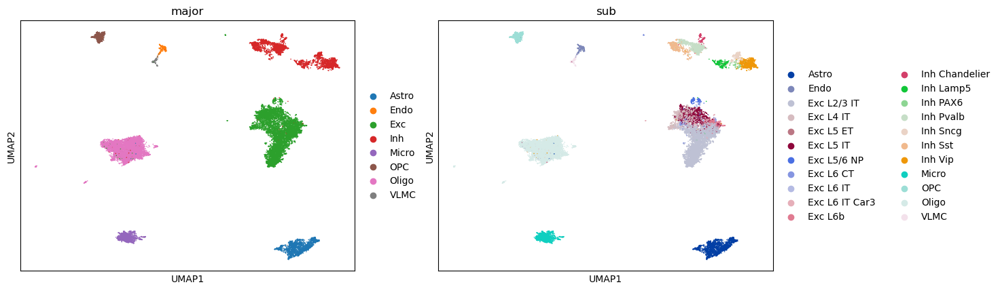

In [56]:
sc.pl.umap(temp, color=['major', 'sub'])

## scGHOST

In [10]:
import json

config = f'{data_dir}/config_dir/config_gage_ad_higashi_500Kb.JSON'
with open(config,"r") as f:
    config_info = json.load(f)
scg_config = f'{data_dir}/config_dir/config_gage_ad_scg_500Kb.JSON'
# filepath settings
schic_directory = config_info['temp_dir']
label_info_path = os.path.join(config_info['data_dir'], "label_info.pickle")
label_info_cell_type_key = "cluster label"
scg_out_directory = os.path.join(config_info['temp_dir'] + "scghost")
NUM_CHROMOSOMES = len(config_info['chrom_list'])
embed_name = config_info['embedding_name']
chrom_list = config_info['chrom_list']
nbr_num= config_info['neighbor_num']
chromosomes = {chrom_num+1 : {
    'adj' : f'{schic_directory}/raw/{chrom}_sparse_adj.npy',
    'imputed' : f'{schic_directory}/{chrom}_{embed_name}_nbr_{nbr_num}_impute.hdf5',
    'integer' : chrom_num+1,
} for chrom_num,chrom in enumerate(chrom_list)}

chrom_sizes = config_info['genome_reference_path']
chrom_indices = None
embeddings_path = os.path.join(config_info['temp_dir'], 'embed', config_info['embedding_name']+"_0_origin.npy")
higashi_scab_path = os.path.join(config_info['temp_dir'], 'scAB_500kb_nbr5.hdf5')

# hyperparameters
random_walk_num_walks = 50
random_walk_ignore_top = 0.02
random_walk_top_percentile = 0.25
eps = 1e-8
num_clusters = 5
batch_size = 16
epochs = 5
resolution = 500000
neighbor_contacts = False
kmeans_init = 1

# misc settings
nearest_neighbor_override = None
gpu_uniques = True
cluster_gpu_caching = False
settings_dict = {
    'schic_directory': schic_directory,
    'label_info': {
        'path': label_info_path,
        'cell_type_key': label_info_cell_type_key,
    },
    'data_directory': scg_out_directory,
    'chromosomes': chromosomes,
    'chrom_sizes': chrom_sizes,
    'chrom_indices': chrom_indices,
    'embeddings_path': embeddings_path,
    'higashi_scab_path': higashi_scab_path,
    'cell_type': None,
    'random_walk': {
        'num_walks': random_walk_num_walks,
        'ignore_top': random_walk_ignore_top,
        'top_percentile': random_walk_top_percentile,
    },
    'eps': eps,
    'num_clusters': num_clusters,
    'batch_size': batch_size,
    'epochs': epochs,
    'resolution': resolution,
    'neighbor_contacts': neighbor_contacts,
    'nearest_neighbor_override': nearest_neighbor_override,
    'gpu_uniques': gpu_uniques,
    'cluster_gpu_caching': cluster_gpu_caching,
    'kmeans_init': kmeans_init,
}


import json 

with open(scg_config, "w") as outfile: 
    json_string = json.dumps(settings_dict, indent=4)
    outfile.write(json_string)
# command = ['python',
#        '/data/rzhang/scGHOST/scghost.py',
#        '--config' ,f'{data_dir}/config_dir/config_gage_ad_scg_500Kb.JSON']
# subprocess.run(command)

import pickle
import os
from tqdm import trange

# enter labels.pkl path
label_filepath = os.path.join(scg_out_directory, 'labels.pkl')
labels = pickle.load(open(label_filepath,'rb'))

# enter cropped_indices.pkl path
cropped_indices_filepath = os.path.join(scg_out_directory, 'cropped_indices.pkl')
cropped_indices = pickle.load(open(cropped_indices_filepath,'rb'))

# enter resolution
resolution = 500000

# enter bed file output directory
# bed_file_directory = os.path.join(scg_out_directory, 'bed_files')
chrom_prefix = 'chr' # change this to '' if chromosomes are labeled chr1,chr2,... instead of 1,2,...

sc_subcompartment_names = ['scA1','scA2','scB1','scB2','scB3'] # default for scGHOST k=5

# os.makedirs(bed_file_directory,exist_ok=True)

num_cells = labels[ list( labels.keys() )[0] ].shape[0]
annotation_all = []
chrom,start,end = [], [], []
for i in range(1, 23):
    annotation_all.append(labels[str(i)])
annotation_all = np.concatenate(annotation_all, axis=-1)
label_info = pickle.load(open(f"{data_dir}/label_info.pickle", "rb"))
meta = pd.DataFrame(label_info)
meta.index = label_info['cell_name_higashi']
scg = anndata.AnnData(X=annotation_all,obs=meta)
for i in range(1, 23):
    chromosome = str(i)
    annotations = labels[chromosome][0]
    
    for locus in range(len(annotations)):
        position = cropped_indices[chromosome][locus]
        annotation = sc_subcompartment_names[ annotations[locus] ]
        chrom.append(f'{chrom_prefix}{chromosome}')
        start.append(int(position * resolution))
        end.append(int((position + 1) * resolution))
scg.var['chrom'] = chrom
scg.var['start'] = start
scg.var['end'] = end
scg.uns['sc_subcompartment_names'] = ['scA1','scA2','scB1','scB2','scB3']
def get_expected(M,eps=1e-8):
    E = np.zeros_like(M)
    l = len(M)

    for i in range(M.shape[0]):
        contacts = np.diag(M,i)
        expected = contacts.sum() / (l-i)
        # expected = np.median(contacts)
        x_diag,y_diag = np.diag_indices(M.shape[0]-i)
        x,y = x_diag,y_diag+i
        E[x,y] = expected

    E += E.T
    E = np.nan_to_num(E) + eps
    
    return E

def get_oe_matrix(M):
    E = get_expected(M)
    oe = np.nan_to_num(M / E)
    np.fill_diagonal(oe,1)
    
    return oe
    

stacked_pcs = []

for chrom_num in range(1,23):
    chrom_indices = pickle.load(open(os.path.join(scg_out_directory, 'chrom_indices.pkl'),'rb'))['%d' % chrom_num]
    sparse_M = np.load(chromosomes[chrom_num]['adj'],allow_pickle=True)
    pseudo_bulk = sparse_M.sum(axis=0).toarray()
    cov = np.sqrt(pseudo_bulk.sum(axis=1))
    pseudo_bulk /= cov[None,:]
    pseudo_bulk /= cov[:,None]
    pseudo_bulk = np.nan_to_num(pseudo_bulk)[chrom_indices][:,chrom_indices]
    pseudo_OE = get_oe_matrix(pseudo_bulk)

    Rpool = np.nan_to_num(np.corrcoef(pseudo_OE))
    Rpoolmean = Rpool.mean(axis=0,keepdims=True)
    Rpool = Rpool - Rpoolmean
    _,_,V = np.linalg.svd(Rpool)

    Es = np.load(os.path.join(scg_out_directory, f'{chrom_num}_embeddings.npy'))
    embedding_corrs = np.zeros((Es.shape[0],Es.shape[1],Es.shape[1]))

    num_cells = len(Es)

    for i in trange(num_cells):
        embedding_corrs[i] = np.corrcoef(Es[i])

    pcs = np.zeros((Es.shape[0],Es.shape[1]))

    for i,ec in enumerate(embedding_corrs):
        tec = ec - Rpoolmean
        pc = tec.dot(V[0,:].T)
        pcs[i] = pc
        
    stacked_pcs.append(pcs)
    
stacked_pcs = np.hstack(stacked_pcs)
scg.obsm['scghost_embeddings'] = stacked_pcs
scg.write(f"{data_dir}/transfer/scGHOST_500k.h5ad")

100%|████████████████████████████████████████████████| 23825/23825 [00:04<00:00, 5193.56it/s]


In [6]:
import anndata

In [94]:
print()